In [1]:
# from emnist import extract_training_samples,extract_test_samples
# train_images, train_labels = extract_training_samples('byclass')
# test_images, test_labels = extract_test_samples('byclass')

In [1]:
import tensorflow as tf

In [2]:
def mish(x):
    return x * tf.math.tanh(tf.math.softplus(x))

In [3]:
class Conv2D(tf.keras.layers.Conv2D):
    def __init__(self,f,k,a,b,**kwdarg):
        super().__init__(
            filters=f,
            kernel_size=k,
            activation=a,
            use_bias=b,
            strides=1,
            padding='valid',
            **kwdarg)
    def call(self,inp,training):
        x = super().call(inp)
        return x

In [4]:
class DepthwiseConv2D(tf.keras.layers.DepthwiseConv2D):
    def __init__(self,m,k,a,b,**kwdarg):
        super().__init__(
            depth_multiplier=m,
            kernel_size=k,
            activation=a,
            use_bias=b,
            strides=1,
            padding='valid',
            **kwdarg)
    def call(self,inp,training):
        x = super().call(inp)
        return x

In [5]:
class DepthControl(tf.keras.layers.Layer):
    def __init__(self,r,a,b,groups=1):
        super().__init__()
        self.r = 2**r
        self.a = a
        self.b = b
        self.groups = groups
    def build(self,input_shape):
        self.conv = Conv2D(
            f=int(input_shape[-1]*self.r),
            k=1,
            a=self.a,
            b=self.b,
            groups=self.groups
        )
    def call(self,inp,training):
        x = self.conv(inp,training=training)
        return x

In [6]:
class SubBlock(tf.keras.layers.Layer):
    def __init__(self,vision_layer,nins):
        super().__init__()
        self.vision_layer = vision_layer
        self.main = tf.keras.Sequential([DepthControl(r=r,a=mish,b=True) for r in nins]+
                                        [DepthControl(r=-r,a=mish,b=True) for r in nins[::-1]])
        self.mix = DepthControl(r=-1,a=mish,b=False)
    def call(self,inp,training):
        x1 = self.vision_layer(inp,training=training)
        x2 = self.main(x1,training=training)
        x = tf.concat([x1,x2],axis=-1)
        x = self.mix(x,training=training)
        return x

In [7]:
class GroupSubBlock(tf.keras.layers.Layer):
    def __init__(self,vision_layer,groups,nins):
        super().__init__()
        self.vision_layer = vision_layer
        self.main = tf.keras.Sequential([DepthControl(r=r,a=mish,b=True,groups=groups) for r in nins]+
                                        [DepthControl(r=-r,a=mish,b=True,groups=groups) for r in nins[::-1]])
    def call(self,inp,training):
        x1 = self.vision_layer(inp,training=training)
        x2 = self.main(x1,training=training)
        x = x1 + x2
        return x

In [8]:
class Contract(tf.keras.layers.Layer):
    def __init__(self):
        super().__init__()
        self.downsample = tf.keras.layers.AveragePooling2D(pool_size=2, strides=2, padding='valid')
        self.increase = DepthControl(r=1,a=None,b=False)
    def call(self,inp,training):
        x = self.downsample(inp,training=training)
        x = self.increase(x,training=training)
        return x

In [9]:
class Model(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.block1 = tf.keras.Sequential([
            SubBlock(DepthwiseConv2D(m=8,k=3,a=None,b=False),[1,1]),
            SubBlock(Conv2D(f=8,k=3,a=mish,b=True),[1,1]),
            Contract()])
        self.block2 = tf.keras.Sequential([
            SubBlock(Conv2D(f=16,k=3,a=mish,b=True),[1,0,0]),
            Contract()])
        self.block3 = tf.keras.Sequential([
            SubBlock(Conv2D(f=32,k=3,a=mish,b=True),[1,0,0]),
            SubBlock(Conv2D(f=32,k=3,a=mish,b=True),[1,0,0]),
            Contract()])
        self.block4 = tf.keras.Sequential([
            SubBlock(Conv2D(f=64,k=2,a=mish,b=True),[-1,0,0]),
            tf.keras.layers.Lambda(lambda x: tf.tile(x,[1,1,1,12]))
        ])
        self.block5 = tf.keras.Sequential([
            GroupSubBlock(Conv2D(f=1032,k=(1,2),a=mish,b=True,groups=12),12,[0,0]), #25
            GroupSubBlock(Conv2D(f=1032,k=(1,2),a=mish,b=True,groups=12),12,[0,0]), #24
            GroupSubBlock(Conv2D(f=1032,k=(1,2),a=mish,b=True,groups=12),12,[0,0]), #23
            tf.keras.layers.AveragePooling2D(pool_size=(1,3), strides=(1,2), padding='valid'), #11
            GroupSubBlock(Conv2D(f=2064,k=(1,2),a=mish,b=True,groups=12),12,[0,0]), #10
            GroupSubBlock(Conv2D(f=2064,k=(1,2),a=mish,b=True,groups=12),12,[0,0]), #9
            tf.keras.layers.AveragePooling2D(pool_size=(1,3), strides=(1,2), padding='valid'), #4
            GroupSubBlock(Conv2D(f=4128,k=(1,2),a=mish,b=True,groups=12),12,[0,0]), #3
            GroupSubBlock(Conv2D(f=4128,k=(1,2),a=mish,b=True,groups=12),12,[0,0]), #2
            GroupSubBlock(Conv2D(f=4128,k=(1,2),a=mish,b=True,groups=12),12,[0,0]), #1
            
            tf.keras.layers.Lambda(lambda x: tf.squeeze(x,axis=[1,2])),
            tf.keras.layers.Reshape([1,12,-1])
        ])
        self.output_layer = tf.keras.Sequential([
            Conv2D(f=1024,k=1,a=mish,b=True),
            Conv2D(f=512,k=1,a=mish,b=True),
            Conv2D(f=256,k=1,a=mish,b=True),
            Conv2D(f=128,k=1,a=mish,b=True),
            Conv2D(f=64,k=1,a=mish,b=True),
            Conv2D(f=36,k=1,a=None,b=False),
            tf.keras.layers.Lambda(lambda x: tf.squeeze(x,axis=1))
        ])
        
    def call(self,image,training):
        x = self.block1(image,training=training)
        x = self.block2(x,training=training)
        x = self.block3(x,training=training)
        x = self.block4(x,training=training)
        x = self.block5(x,training=training)
        x = self.output_layer(x,training=training)
        return x
    
    def predict(self,image):
        raw_predict = self(image,training=False)
        predict = tf.argmax(raw_predict,axis=-1)
        predict = predict.numpy()
        predict = [utils.token2char(p) for p in predict]
        return predict

In [10]:
model = Model()

In [11]:
model.load_weights(r'D:\DL_competition_Dataset\ChinaSteel\OCR_model_weights\model_6\trial_1\0057_1p58644\weights')

In [12]:
import FLAGS

FLAGS.MODEL = model
FLAGS.CORPUS = ' 0123456789ABCDEFGHIJKLMNPQRSTUVWXYZ'
FLAGS.IMAGE_SHAPE = (40,240)
FLAGS.SEQUENCE_SIZE = 12

FLAGS.TRAIN.RECORD_WEIGHTS_PATH = r'D:\DL_competition_Dataset\ChinaSteel\OCR_model_weights\model_6\trial_1_finetune'
# FLAGS.TRAIN.RECORD_WEIGHTS_PATH = r'C:\Users\Atlas\Desktop\weights'
FLAGS.TRAIN.LABEL_SMOOTHING = 0.001
FLAGS.TRAIN.OPTIMIZER.TYPE = tf.keras.optimizers.Adam
FLAGS.TRAIN.OPTIMIZER.MAX_LR = 1e-6
FLAGS.TRAIN.OPTIMIZER.SCHEDULE_GAMMA = -2
FLAGS.TRAIN.EPOCH.TOTAL = 300
FLAGS.TRAIN.EPOCH.WARMUP = 2

FLAGS.DATA.TRAIN.TABLE_PATH = 'cleaned_merge_table.csv'
# FLAGS.DATA.TRAIN.IMAGE_PATH = r'C:\Users\Atlas\Desktop\ChinaSteel_dataset\custom\train_segment'
FLAGS.DATA.TRAIN.IMAGE_PATH = r'D:\DL_competition_Dataset\ChinaSteel\dataset\custom\segment\rotated_train'
FLAGS.DATA.TRAIN.TRAIN_BATCH_SIZE = 6
FLAGS.DATA.TRAIN.VALIDATION_RATIO = 0.05
FLAGS.DATA.TRAIN.VALIDATION_BATCH_SIZE = 8
# FLAGS.DATA.TEST.IMAGE_PATH = r'C:\Users\Atlas\Desktop\ChinaSteel_dataset\custom\test_segment'
FLAGS.DATA.TEST.IMAGE_PATH = r'D:\DL_competition_Dataset\ChinaSteel\dataset\custom\segment\rotated_test'
FLAGS.DATA.TEST.BATCH_SIZE = 8

import utils

STEP:    100 TRAIN loss CE: 43.00045, Correct ratio 0.19339, All correct: 0.00000
STEP:    200 TRAIN loss CE: 42.99382, Correct ratio 0.19415, All correct: 0.00000
STEP:    300 TRAIN loss CE: 42.97009, Correct ratio 0.19384, All correct: 0.00000
STEP:    400 TRAIN loss CE: 42.67513, Correct ratio 0.19721, All correct: 0.00000
STEP:    500 TRAIN loss CE: 40.85387, Correct ratio 0.20228, All correct: 0.00000
STEP:    600 TRAIN loss CE: 38.44567, Correct ratio 0.22797, All correct: 0.00000
STEP:    700 TRAIN loss CE: 36.36731, Correct ratio 0.25390, All correct: 0.00000
STEP:    800 TRAIN loss CE: 34.60459, Correct ratio 0.27497, All correct: 0.00000
STEP:    900 TRAIN loss CE: 33.08156, Correct ratio 0.29132, All correct: 0.00000
STEP:   1000 TRAIN loss CE: 31.75042, Correct ratio 0.30415, All correct: 0.00000
STEP:   1100 TRAIN loss CE: 30.60880, Correct ratio 0.31548, All correct: 0.00000
STEP:   1200 TRAIN loss CE: 29.64353, Correct ratio 0.32443, All correct: 0.00000
STEP:   1300 TRA

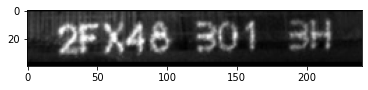

2LU992022A


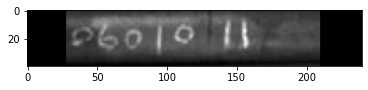

2LU992022A


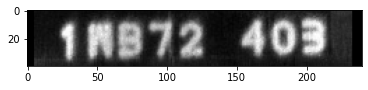

2LU992022A


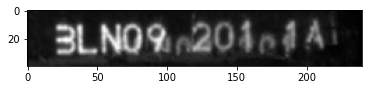

2LU992022A


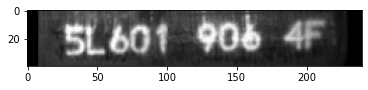

2LU992022A


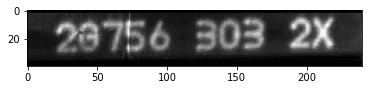

2LU992022A


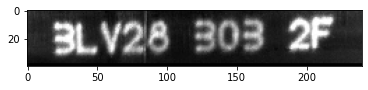

2LU992022A


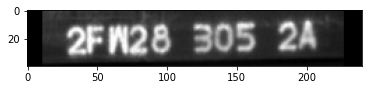

STEP:   2200 TRAIN loss CE: 18.62083, Correct ratio 0.42304, All correct: 0.00000
STEP:   2300 TRAIN loss CE: 18.80316, Correct ratio 0.42401, All correct: 0.00000
STEP:   2400 TRAIN loss CE: 18.87696, Correct ratio 0.42298, All correct: 0.00000
STEP:   2500 TRAIN loss CE: 18.87660, Correct ratio 0.42559, All correct: 0.00000
STEP:   2600 TRAIN loss CE: 18.87553, Correct ratio 0.42880, All correct: 0.00000
STEP:   2700 TRAIN loss CE: 18.85221, Correct ratio 0.42961, All correct: 0.00000
STEP:   2800 TRAIN loss CE: 18.83285, Correct ratio 0.42973, All correct: 0.00000
STEP:   2900 TRAIN loss CE: 18.83153, Correct ratio 0.42966, All correct: 0.00000
STEP:   3000 TRAIN loss CE: 18.82618, Correct ratio 0.43006, All correct: 0.00000
STEP:   3100 TRAIN loss CE: 18.81703, Correct ratio 0.42928, All correct: 0.00000
STEP:   3200 TRAIN loss CE: 18.82840, Correct ratio 0.43023, All correct: 0.00000
STEP:   3300 TRAIN loss CE: 18.82313, Correct ratio 0.43029, All correct: 0.00000
STEP:   3400 TRA

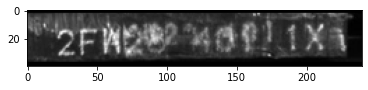

3LT111012F


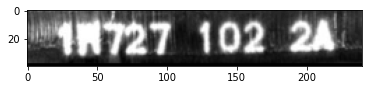

3LT111012F


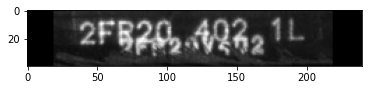

3LT111012F


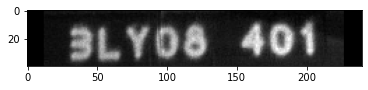

3LT111012F


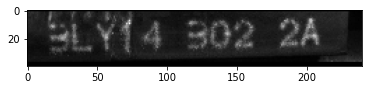

3LT111012F


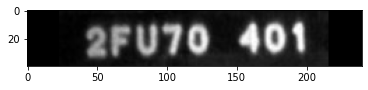

3LT111012F


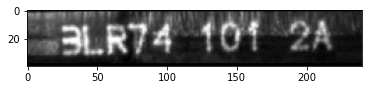

3LT111012F


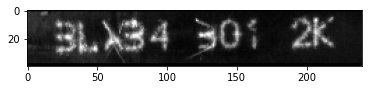

STEP:   4400 TRAIN loss CE: 18.66467, Correct ratio 0.43056, All correct: 0.00000
STEP:   4500 TRAIN loss CE: 18.71495, Correct ratio 0.42803, All correct: 0.00000
STEP:   4600 TRAIN loss CE: 18.74399, Correct ratio 0.42921, All correct: 0.00000
STEP:   4700 TRAIN loss CE: 18.70639, Correct ratio 0.42836, All correct: 0.00000
STEP:   4800 TRAIN loss CE: 18.67031, Correct ratio 0.42994, All correct: 0.00000
STEP:   4900 TRAIN loss CE: 18.70933, Correct ratio 0.43147, All correct: 0.00000
STEP:   5000 TRAIN loss CE: 18.71592, Correct ratio 0.43072, All correct: 0.00000
STEP:   5100 TRAIN loss CE: 18.70588, Correct ratio 0.43030, All correct: 0.00000
STEP:   5200 TRAIN loss CE: 18.73828, Correct ratio 0.42990, All correct: 0.00000
STEP:   5300 TRAIN loss CE: 18.74187, Correct ratio 0.42961, All correct: 0.00000
STEP:   5400 TRAIN loss CE: 18.73197, Correct ratio 0.43027, All correct: 0.00000
STEP:   5500 TRAIN loss CE: 18.73212, Correct ratio 0.43029, All correct: 0.00000
STEP:   5600 TRA

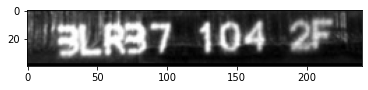

3LU994012A


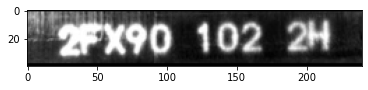

3LU99401A


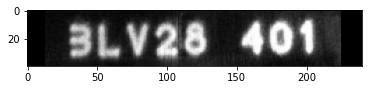

3LU994012F


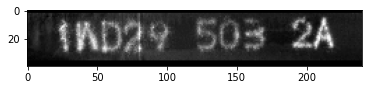

3LU994012F


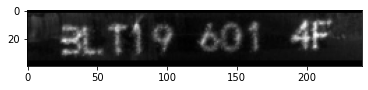

3LU994012F


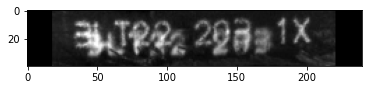

3LU994012F


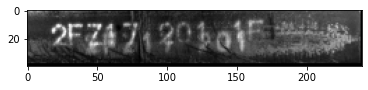

3LU994012F


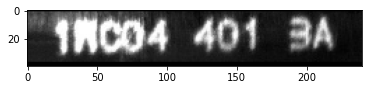

STEP:   6500 TRAIN loss CE: 18.25341, Correct ratio 0.45961, All correct: 0.00000
STEP:   6600 TRAIN loss CE: 18.14992, Correct ratio 0.44925, All correct: 0.00000
STEP:   6700 TRAIN loss CE: 18.04708, Correct ratio 0.45277, All correct: 0.00000
STEP:   6800 TRAIN loss CE: 18.01609, Correct ratio 0.45526, All correct: 0.00000
STEP:   6900 TRAIN loss CE: 18.00356, Correct ratio 0.45785, All correct: 0.00000
STEP:   7000 TRAIN loss CE: 18.01129, Correct ratio 0.45852, All correct: 0.00000
STEP:   7100 TRAIN loss CE: 17.98153, Correct ratio 0.45942, All correct: 0.00000
STEP:   7200 TRAIN loss CE: 17.97879, Correct ratio 0.45935, All correct: 0.00000
STEP:   7300 TRAIN loss CE: 17.94293, Correct ratio 0.46066, All correct: 0.00000
STEP:   7400 TRAIN loss CE: 17.92231, Correct ratio 0.46103, All correct: 0.00000
STEP:   7500 TRAIN loss CE: 17.89152, Correct ratio 0.46176, All correct: 0.00000
STEP:   7600 TRAIN loss CE: 17.89054, Correct ratio 0.46223, All correct: 0.00000
STEP:   7700 TRA

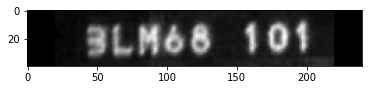

3LV24402


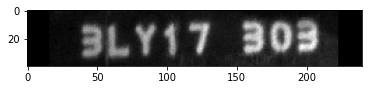

3L0244032A


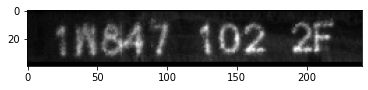

3LV294012A


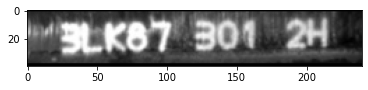

3LV24402


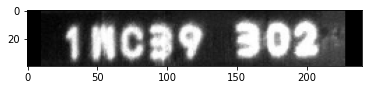

3LV294022A


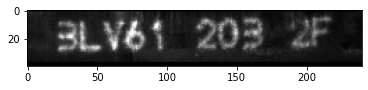

3L0244022A


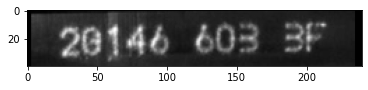

3LV294022F


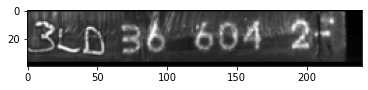

STEP:   8700 TRAIN loss CE: 17.55651, Correct ratio 0.48169, All correct: 0.00000
STEP:   8800 TRAIN loss CE: 17.43544, Correct ratio 0.48451, All correct: 0.00000
STEP:   8900 TRAIN loss CE: 17.41821, Correct ratio 0.48390, All correct: 0.00000
STEP:   9000 TRAIN loss CE: 17.37688, Correct ratio 0.48462, All correct: 0.00000
STEP:   9100 TRAIN loss CE: 17.34929, Correct ratio 0.48512, All correct: 0.00000
STEP:   9200 TRAIN loss CE: 17.29396, Correct ratio 0.48647, All correct: 0.00000
STEP:   9300 TRAIN loss CE: 17.24822, Correct ratio 0.48893, All correct: 0.00000
STEP:   9400 TRAIN loss CE: 17.17240, Correct ratio 0.49295, All correct: 0.00000
STEP:   9500 TRAIN loss CE: 17.08058, Correct ratio 0.49632, All correct: 0.00000
STEP:   9600 TRAIN loss CE: 16.99322, Correct ratio 0.50071, All correct: 0.00000
STEP:   9700 TRAIN loss CE: 16.88321, Correct ratio 0.50597, All correct: 0.00000
STEP:   9800 TRAIN loss CE: 16.72703, Correct ratio 0.51214, All correct: 0.00000
STEP:   9900 TRA

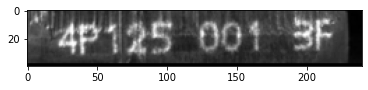

3LU552021F


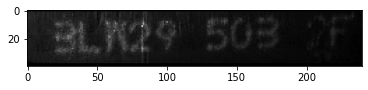

3LU83303


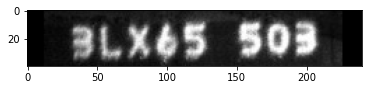

3LU334032F


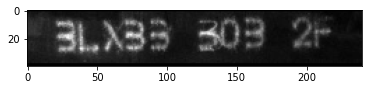

3LU882032F


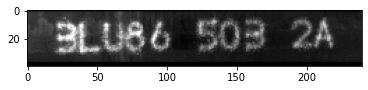

2GU973013F


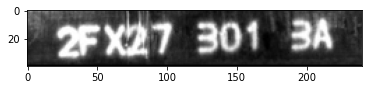

3LU39304


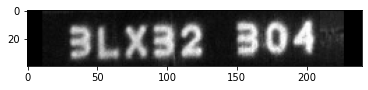

1W855301


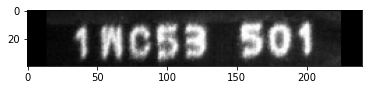

STEP:  10800 TRAIN loss CE: 10.59348, Correct ratio 0.72406, All correct: 0.00765
STEP:  10900 TRAIN loss CE: 10.71690, Correct ratio 0.72553, All correct: 0.00839
STEP:  11000 TRAIN loss CE: 10.54018, Correct ratio 0.72871, All correct: 0.00853
STEP:  11100 TRAIN loss CE: 10.56174, Correct ratio 0.72854, All correct: 0.00967
STEP:  11200 TRAIN loss CE: 10.43610, Correct ratio 0.73230, All correct: 0.01086
STEP:  11300 TRAIN loss CE: 10.38638, Correct ratio 0.73323, All correct: 0.01025
STEP:  11400 TRAIN loss CE: 10.35890, Correct ratio 0.73458, All correct: 0.01156
STEP:  11500 TRAIN loss CE: 10.27461, Correct ratio 0.73759, All correct: 0.01202
STEP:  11600 TRAIN loss CE: 10.21431, Correct ratio 0.73951, All correct: 0.01237
STEP:  11700 TRAIN loss CE: 10.15121, Correct ratio 0.74221, All correct: 0.01383
STEP:  11800 TRAIN loss CE: 10.07377, Correct ratio 0.74515, All correct: 0.01525
STEP:  11900 TRAIN loss CE: 10.00979, Correct ratio 0.74812, All correct: 0.01719
STEP:  12000 TRA

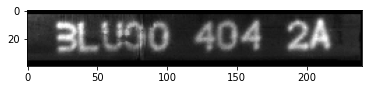

3LV084022A


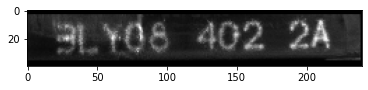

3LP601022F


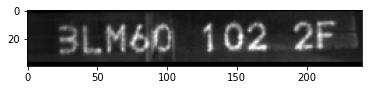

2FT345012A


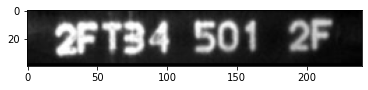

1WG031021F


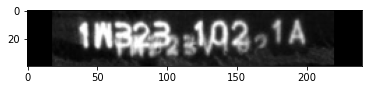

2FV273012A


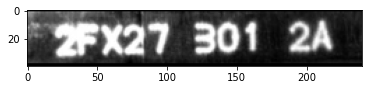

3LQ501013K


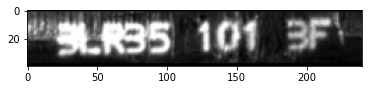

1WA043063A


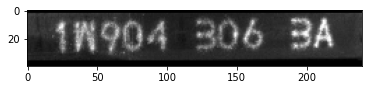

STEP:  13000 TRAIN loss CE: 8.06628, Correct ratio 0.80703, All correct: 0.07702
STEP:  13100 TRAIN loss CE: 8.14190, Correct ratio 0.80371, All correct: 0.06784
STEP:  13200 TRAIN loss CE: 7.99662, Correct ratio 0.80675, All correct: 0.07065
STEP:  13300 TRAIN loss CE: 8.03938, Correct ratio 0.80678, All correct: 0.07143
STEP:  13400 TRAIN loss CE: 7.95947, Correct ratio 0.80874, All correct: 0.07415
STEP:  13500 TRAIN loss CE: 7.88515, Correct ratio 0.81120, All correct: 0.07826
STEP:  13600 TRAIN loss CE: 7.79281, Correct ratio 0.81365, All correct: 0.07797
STEP:  13700 TRAIN loss CE: 7.74377, Correct ratio 0.81529, All correct: 0.08323
STEP:  13800 TRAIN loss CE: 7.66623, Correct ratio 0.81719, All correct: 0.08398
STEP:  13900 TRAIN loss CE: 7.62523, Correct ratio 0.81815, All correct: 0.08534
STEP:  14000 TRAIN loss CE: 7.57857, Correct ratio 0.81983, All correct: 0.08826
STEP:  14100 TRAIN loss CE: 7.54049, Correct ratio 0.82090, All correct: 0.09028
STEP:  14200 TRAIN loss CE: 

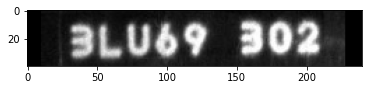

3LQ681013F


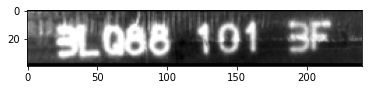

1W8061022A


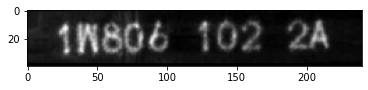

3LU694042A


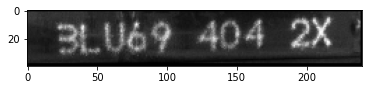

3LU30302


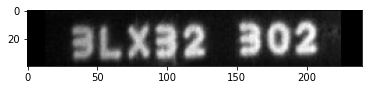

1W534101


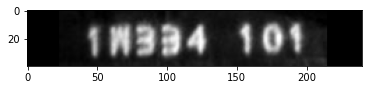

1W8556023T


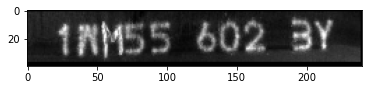

3LN351032H


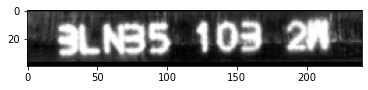

STEP:  15100 TRAIN loss CE: 5.80941, Correct ratio 0.87628, All correct: 0.27551
STEP:  15200 TRAIN loss CE: 5.74098, Correct ratio 0.87528, All correct: 0.24245
STEP:  15300 TRAIN loss CE: 5.74755, Correct ratio 0.87584, All correct: 0.24950
STEP:  15400 TRAIN loss CE: 5.72207, Correct ratio 0.87739, All correct: 0.25824
STEP:  15500 TRAIN loss CE: 5.70162, Correct ratio 0.87741, All correct: 0.26169
STEP:  15600 TRAIN loss CE: 5.66900, Correct ratio 0.87880, All correct: 0.26526
STEP:  15700 TRAIN loss CE: 5.62151, Correct ratio 0.88010, All correct: 0.26791
STEP:  15800 TRAIN loss CE: 5.61282, Correct ratio 0.88035, All correct: 0.27136
STEP:  15900 TRAIN loss CE: 5.56447, Correct ratio 0.88182, All correct: 0.27709
STEP:  16000 TRAIN loss CE: 5.54895, Correct ratio 0.88233, All correct: 0.27898
STEP:  16100 TRAIN loss CE: 5.50159, Correct ratio 0.88364, All correct: 0.28384
STEP:  16200 TRAIN loss CE: 5.46982, Correct ratio 0.88427, All correct: 0.28797
STEP:  16300 TRAIN loss CE: 

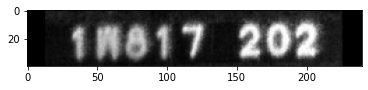

3LL343013H


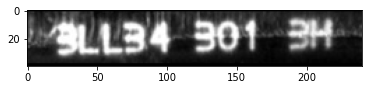

1W885502


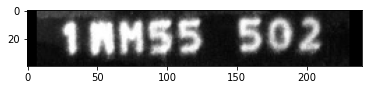

3LU133072A


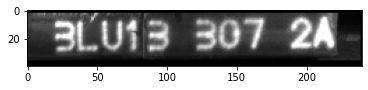

1WA20303


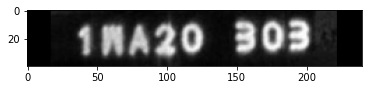

1WL553032A


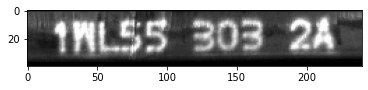

3LU613023A


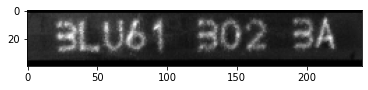

2G183302


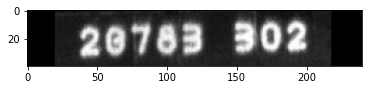

STEP:  17300 TRAIN loss CE: 4.53814, Correct ratio 0.91119, All correct: 0.42424
STEP:  17400 TRAIN loss CE: 4.45516, Correct ratio 0.91290, All correct: 0.41771
STEP:  17500 TRAIN loss CE: 4.42616, Correct ratio 0.91378, All correct: 0.41346
STEP:  17600 TRAIN loss CE: 4.40061, Correct ratio 0.91539, All correct: 0.42669
STEP:  17700 TRAIN loss CE: 4.45662, Correct ratio 0.91420, All correct: 0.42360
STEP:  17800 TRAIN loss CE: 4.44123, Correct ratio 0.91479, All correct: 0.42675
STEP:  17900 TRAIN loss CE: 4.43510, Correct ratio 0.91507, All correct: 0.43205
STEP:  18000 TRAIN loss CE: 4.42032, Correct ratio 0.91564, All correct: 0.43867
STEP:  18100 TRAIN loss CE: 4.40511, Correct ratio 0.91608, All correct: 0.43993
STEP:  18200 TRAIN loss CE: 4.36316, Correct ratio 0.91675, All correct: 0.44032
STEP:  18300 TRAIN loss CE: 4.37679, Correct ratio 0.91646, All correct: 0.44097
STEP:  18400 TRAIN loss CE: 4.37581, Correct ratio 0.91659, All correct: 0.44266
STEP:  18500 TRAIN loss CE: 

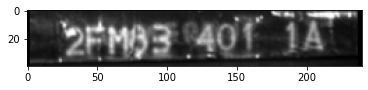

2G1094053T


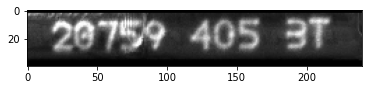

1WD54404


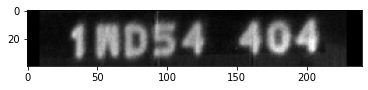

3LU153012A


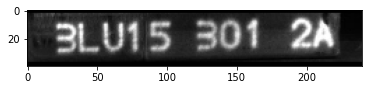

1WF083033A


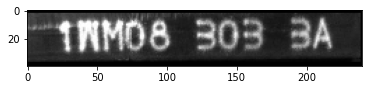

3LX645012F


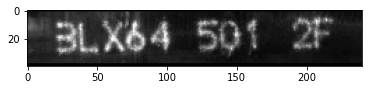

2G160402


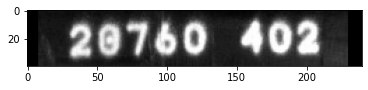

1WE49402


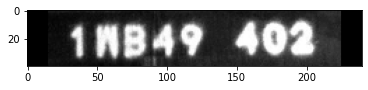

STEP:  19400 TRAIN loss CE: 3.64274, Correct ratio 0.93686, All correct: 0.54592
STEP:  19500 TRAIN loss CE: 3.57180, Correct ratio 0.93750, All correct: 0.53859
STEP:  19600 TRAIN loss CE: 3.68966, Correct ratio 0.93491, All correct: 0.53916
STEP:  19700 TRAIN loss CE: 3.72434, Correct ratio 0.93380, All correct: 0.53331
STEP:  19800 TRAIN loss CE: 3.74721, Correct ratio 0.93414, All correct: 0.54315
STEP:  19900 TRAIN loss CE: 3.79025, Correct ratio 0.93374, All correct: 0.54394
STEP:  20000 TRAIN loss CE: 3.73529, Correct ratio 0.93480, All correct: 0.54815
STEP:  20100 TRAIN loss CE: 3.72659, Correct ratio 0.93504, All correct: 0.55040
STEP:  20200 TRAIN loss CE: 3.77327, Correct ratio 0.93383, All correct: 0.54756
STEP:  20300 TRAIN loss CE: 3.77911, Correct ratio 0.93352, All correct: 0.54413
STEP:  20400 TRAIN loss CE: 3.75216, Correct ratio 0.93394, All correct: 0.54421
STEP:  20500 TRAIN loss CE: 3.76147, Correct ratio 0.93367, All correct: 0.54493
STEP:  20600 TRAIN loss CE: 

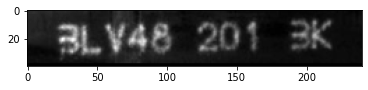

3LM012033F


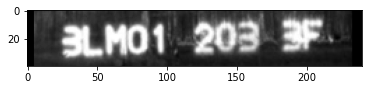

2GT564023A


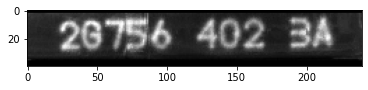

1WA404042L


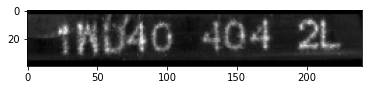

3LM30504


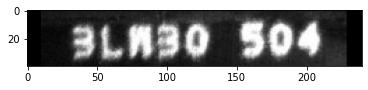

3LP351014F


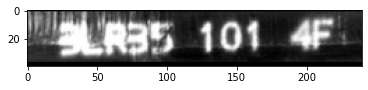

2FW89302


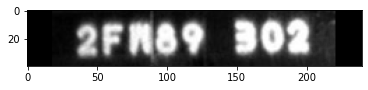

3LP38202


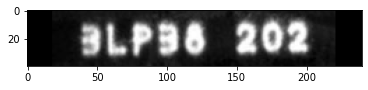

STEP:  21600 TRAIN loss CE: 3.56251, Correct ratio 0.94171, All correct: 0.59722
STEP:  21700 TRAIN loss CE: 3.49723, Correct ratio 0.94279, All correct: 0.60113
STEP:  21800 TRAIN loss CE: 3.54228, Correct ratio 0.94182, All correct: 0.60410
STEP:  21900 TRAIN loss CE: 4.00131, Correct ratio 0.93405, All correct: 0.57112
STEP:  22000 TRAIN loss CE: 3.98176, Correct ratio 0.93397, All correct: 0.56738
STEP:  22100 TRAIN loss CE: 3.90446, Correct ratio 0.93494, All correct: 0.56469
STEP:  22200 TRAIN loss CE: 3.83839, Correct ratio 0.93623, All correct: 0.57207
STEP:  22300 TRAIN loss CE: 3.76271, Correct ratio 0.93774, All correct: 0.57697
STEP:  22400 TRAIN loss CE: 3.72860, Correct ratio 0.93847, All correct: 0.58259
STEP:  22500 TRAIN loss CE: 3.69400, Correct ratio 0.93921, All correct: 0.58458
STEP:  22600 TRAIN loss CE: 3.63466, Correct ratio 0.94055, All correct: 0.59145
STEP:  22700 TRAIN loss CE: 3.61558, Correct ratio 0.94092, All correct: 0.59518
STEP:  22800 TRAIN loss CE: 

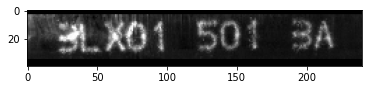

1WB366032F


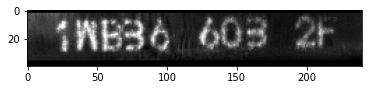

3LS16503


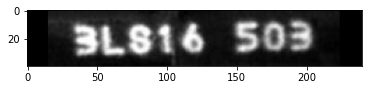

1WB493043F


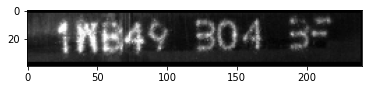

2G757302


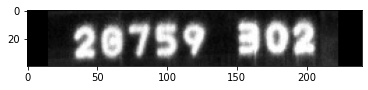

2FU671011A


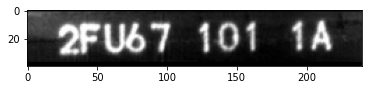

3LU213012T


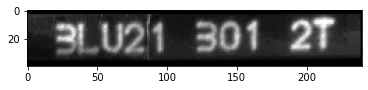

1WB204032F


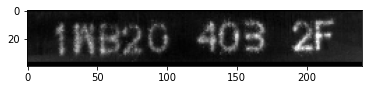

STEP:  23700 TRAIN loss CE: 3.41005, Correct ratio 0.94558, All correct: 0.63010
STEP:  23800 TRAIN loss CE: 3.22299, Correct ratio 0.95057, All correct: 0.65352
STEP:  23900 TRAIN loss CE: 3.06006, Correct ratio 0.95373, All correct: 0.66667
STEP:  24000 TRAIN loss CE: 3.02227, Correct ratio 0.95377, All correct: 0.67371
STEP:  24100 TRAIN loss CE: 3.03542, Correct ratio 0.95358, All correct: 0.66759
STEP:  24200 TRAIN loss CE: 3.04289, Correct ratio 0.95367, All correct: 0.66917
STEP:  24300 TRAIN loss CE: 3.06291, Correct ratio 0.95326, All correct: 0.66525
STEP:  24400 TRAIN loss CE: 3.07342, Correct ratio 0.95305, All correct: 0.66439
STEP:  24500 TRAIN loss CE: 3.10245, Correct ratio 0.95235, All correct: 0.66034
STEP:  24600 TRAIN loss CE: 3.10843, Correct ratio 0.95225, All correct: 0.66267
STEP:  24700 TRAIN loss CE: 3.13989, Correct ratio 0.95160, All correct: 0.66051
STEP:  24800 TRAIN loss CE: 3.13688, Correct ratio 0.95160, All correct: 0.66079
STEP:  24900 TRAIN loss CE: 

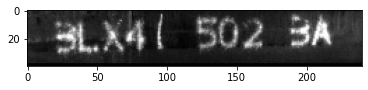

1W987402


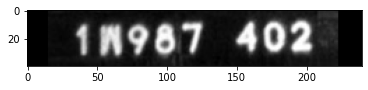

2G029501


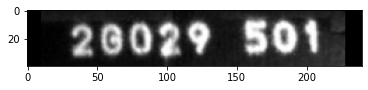

2FZ836023A


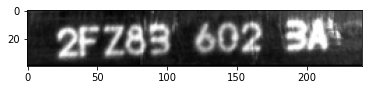

3LY15305


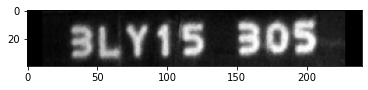

3LU213033T


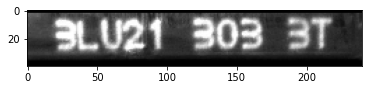

1WD044012A


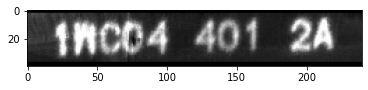

1W8624012T


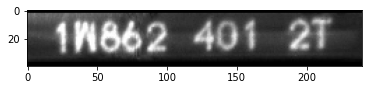

STEP:  25900 TRAIN loss CE: 2.80473, Correct ratio 0.95823, All correct: 0.67677
STEP:  26000 TRAIN loss CE: 2.84035, Correct ratio 0.95765, All correct: 0.67839
STEP:  26100 TRAIN loss CE: 2.83558, Correct ratio 0.95816, All correct: 0.69774
STEP:  26200 TRAIN loss CE: 2.89349, Correct ratio 0.95711, All correct: 0.69236
STEP:  26300 TRAIN loss CE: 2.94340, Correct ratio 0.95610, All correct: 0.68913
STEP:  26400 TRAIN loss CE: 2.89136, Correct ratio 0.95720, All correct: 0.69386
STEP:  26500 TRAIN loss CE: 2.91042, Correct ratio 0.95683, All correct: 0.69725
STEP:  26600 TRAIN loss CE: 2.92841, Correct ratio 0.95676, All correct: 0.69743
STEP:  26700 TRAIN loss CE: 2.95112, Correct ratio 0.95631, All correct: 0.69647
STEP:  26800 TRAIN loss CE: 2.94383, Correct ratio 0.95675, All correct: 0.69870
STEP:  26900 TRAIN loss CE: 2.96245, Correct ratio 0.95629, All correct: 0.69927
STEP:  27000 TRAIN loss CE: 3.06861, Correct ratio 0.95553, All correct: 0.69548
STEP:  27100 TRAIN loss CE: 

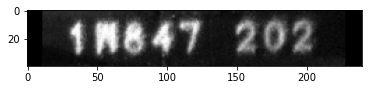

2FZ42401


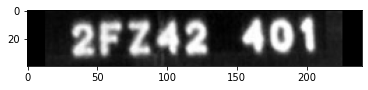

2FV974052K


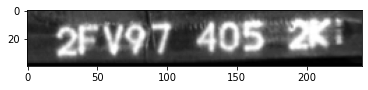

3LL992013F


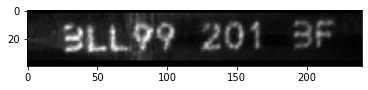

3LR832032F


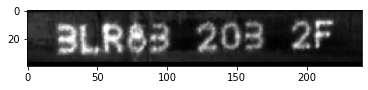

3LT195013F


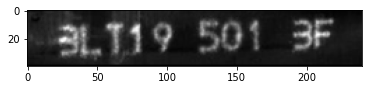

5FN708063A


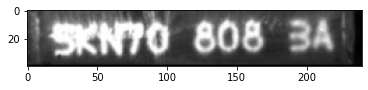

2G7643044K


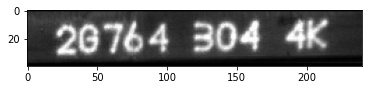

STEP:  28000 TRAIN loss CE: 2.81725, Correct ratio 0.96173, All correct: 0.71173
STEP:  28100 TRAIN loss CE: 2.73274, Correct ratio 0.96295, All correct: 0.72399
STEP:  28200 TRAIN loss CE: 2.85628, Correct ratio 0.95938, All correct: 0.70683
STEP:  28300 TRAIN loss CE: 2.95550, Correct ratio 0.95750, All correct: 0.68840
STEP:  28400 TRAIN loss CE: 2.95801, Correct ratio 0.95706, All correct: 0.68987
STEP:  28500 TRAIN loss CE: 2.95593, Correct ratio 0.95665, All correct: 0.69285
STEP:  28600 TRAIN loss CE: 2.98212, Correct ratio 0.95581, All correct: 0.69126
STEP:  28700 TRAIN loss CE: 2.94256, Correct ratio 0.95662, All correct: 0.69276
STEP:  28800 TRAIN loss CE: 2.90465, Correct ratio 0.95756, All correct: 0.69876
STEP:  28900 TRAIN loss CE: 2.91700, Correct ratio 0.95754, All correct: 0.69995
STEP:  29000 TRAIN loss CE: 2.91833, Correct ratio 0.95749, All correct: 0.69840
STEP:  29100 TRAIN loss CE: 2.90261, Correct ratio 0.95780, All correct: 0.70050
STEP:  29200 TRAIN loss CE: 

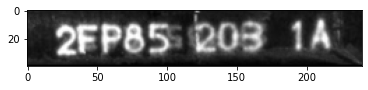

1W9033042A


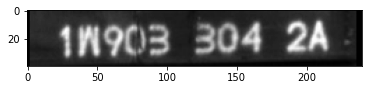

2FU543012F


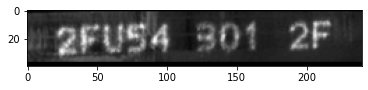

3LS753012X


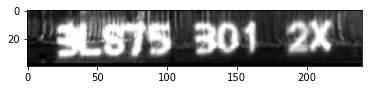

1WA69503


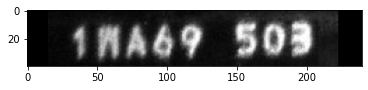

3LR795022F


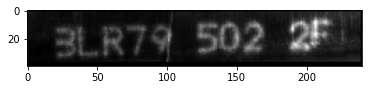

4P4327013T


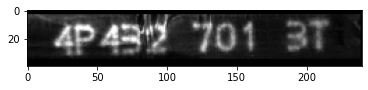

3LP354044K


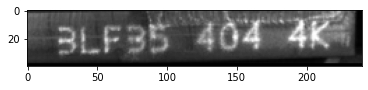

STEP:  30200 TRAIN loss CE: 2.81694, Correct ratio 0.96117, All correct: 0.74495
STEP:  30300 TRAIN loss CE: 2.58931, Correct ratio 0.96545, All correct: 0.75628
STEP:  30400 TRAIN loss CE: 2.75966, Correct ratio 0.96237, All correct: 0.74624
STEP:  30500 TRAIN loss CE: 2.74584, Correct ratio 0.96259, All correct: 0.74843
STEP:  30600 TRAIN loss CE: 2.68329, Correct ratio 0.96401, All correct: 0.75175
STEP:  30700 TRAIN loss CE: 2.72078, Correct ratio 0.96280, All correct: 0.74437
STEP:  30800 TRAIN loss CE: 2.76097, Correct ratio 0.96204, All correct: 0.73784
STEP:  30900 TRAIN loss CE: 2.80670, Correct ratio 0.96171, All correct: 0.73561
STEP:  31000 TRAIN loss CE: 2.84221, Correct ratio 0.96098, All correct: 0.73373
STEP:  31100 TRAIN loss CE: 2.84879, Correct ratio 0.96063, All correct: 0.73061
STEP:  31200 TRAIN loss CE: 2.86231, Correct ratio 0.96028, All correct: 0.72805
STEP:  31300 TRAIN loss CE: 2.84791, Correct ratio 0.96060, All correct: 0.72925
STEP:  31400 TRAIN loss CE: 

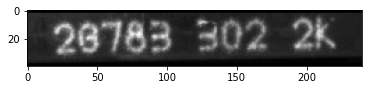

3LH511011T


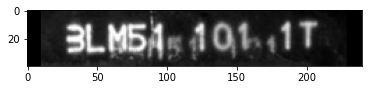

1W8661011H


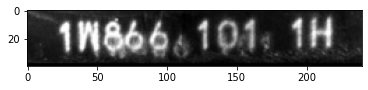

3LX18502


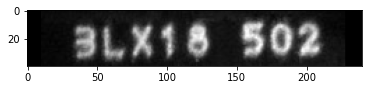

1WH715012A


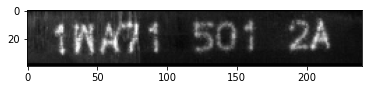

3LU213033T


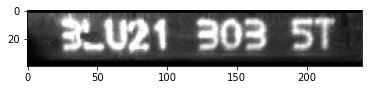

1WB74402


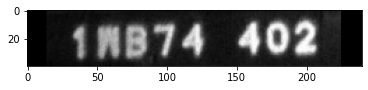

3LV28401


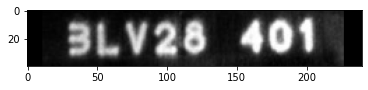

STEP:  32300 TRAIN loss CE: 2.76507, Correct ratio 0.96301, All correct: 0.73469
STEP:  32400 TRAIN loss CE: 2.65275, Correct ratio 0.96442, All correct: 0.75503
STEP:  32500 TRAIN loss CE: 2.50436, Correct ratio 0.96846, All correct: 0.78363
STEP:  32600 TRAIN loss CE: 2.55046, Correct ratio 0.96747, All correct: 0.77256
STEP:  32700 TRAIN loss CE: 2.60181, Correct ratio 0.96669, All correct: 0.77060
STEP:  32800 TRAIN loss CE: 2.64819, Correct ratio 0.96533, All correct: 0.76275
STEP:  32900 TRAIN loss CE: 2.64748, Correct ratio 0.96536, All correct: 0.76194
STEP:  33000 TRAIN loss CE: 2.71815, Correct ratio 0.96427, All correct: 0.75601
STEP:  33100 TRAIN loss CE: 2.72453, Correct ratio 0.96406, All correct: 0.75398
STEP:  33200 TRAIN loss CE: 2.70934, Correct ratio 0.96444, All correct: 0.75540
STEP:  33300 TRAIN loss CE: 2.72560, Correct ratio 0.96392, All correct: 0.75286
STEP:  33400 TRAIN loss CE: 2.72429, Correct ratio 0.96402, All correct: 0.75337
STEP:  33500 TRAIN loss CE: 

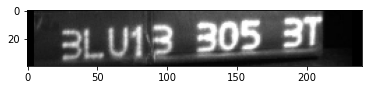

1WL993023L


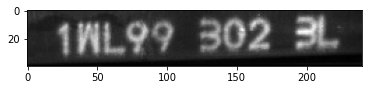

3LV17302


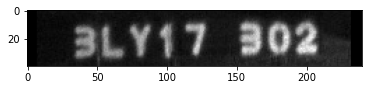

3LX025022A


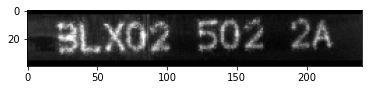

6S5748054T


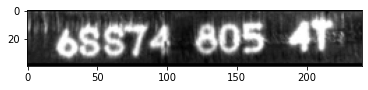

2FV211011N


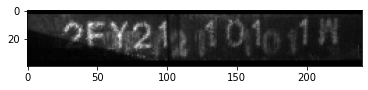

3LV481032F


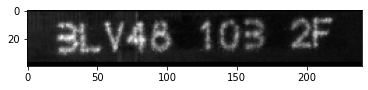

2FS141013A


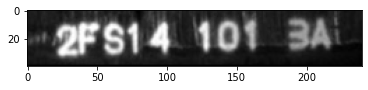

STEP:  34500 TRAIN loss CE: 2.98108, Correct ratio 0.95949, All correct: 0.73106
STEP:  34600 TRAIN loss CE: 2.75391, Correct ratio 0.96352, All correct: 0.74874
STEP:  34700 TRAIN loss CE: 2.74563, Correct ratio 0.96359, All correct: 0.75460
STEP:  34800 TRAIN loss CE: 2.74001, Correct ratio 0.96316, All correct: 0.75157
STEP:  34900 TRAIN loss CE: 2.68459, Correct ratio 0.96462, All correct: 0.75626
STEP:  35000 TRAIN loss CE: 2.64330, Correct ratio 0.96552, All correct: 0.76064
STEP:  35100 TRAIN loss CE: 2.64694, Correct ratio 0.96547, All correct: 0.76180
STEP:  35200 TRAIN loss CE: 2.61967, Correct ratio 0.96629, All correct: 0.76799
STEP:  35300 TRAIN loss CE: 2.61337, Correct ratio 0.96644, All correct: 0.76766
STEP:  35400 TRAIN loss CE: 2.59774, Correct ratio 0.96687, All correct: 0.77090
STEP:  35500 TRAIN loss CE: 2.59699, Correct ratio 0.96694, All correct: 0.77127
STEP:  35600 TRAIN loss CE: 2.56866, Correct ratio 0.96757, All correct: 0.77408
STEP:  35700 TRAIN loss CE: 

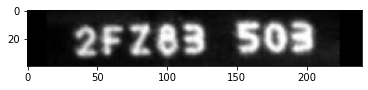

2G805102


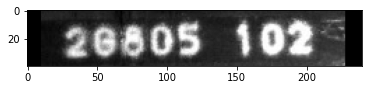

1WH08303


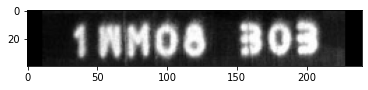

3LT236024A


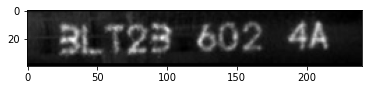

2G0783052A


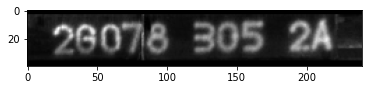

3LU153013A


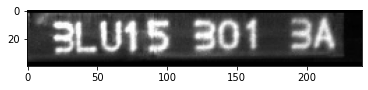

1W652101


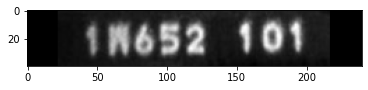

3LU693022X


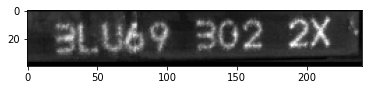

STEP:  36600 TRAIN loss CE: 2.50468, Correct ratio 0.96599, All correct: 0.80357
STEP:  36700 TRAIN loss CE: 2.26419, Correct ratio 0.97378, All correct: 0.82466
STEP:  36800 TRAIN loss CE: 2.17775, Correct ratio 0.97595, All correct: 0.83032
STEP:  36900 TRAIN loss CE: 2.23153, Correct ratio 0.97490, All correct: 0.82951
STEP:  37000 TRAIN loss CE: 2.31654, Correct ratio 0.97293, All correct: 0.81180
STEP:  37100 TRAIN loss CE: 2.39318, Correct ratio 0.97103, All correct: 0.79872
STEP:  37200 TRAIN loss CE: 2.39281, Correct ratio 0.97106, All correct: 0.79796
STEP:  37300 TRAIN loss CE: 2.40823, Correct ratio 0.97059, All correct: 0.79306
STEP:  37400 TRAIN loss CE: 2.39627, Correct ratio 0.97079, All correct: 0.79579
STEP:  37500 TRAIN loss CE: 2.41272, Correct ratio 0.97067, All correct: 0.79729
STEP:  37600 TRAIN loss CE: 2.41962, Correct ratio 0.97054, All correct: 0.79647
STEP:  37700 TRAIN loss CE: 2.42578, Correct ratio 0.97052, All correct: 0.79667
STEP:  37800 TRAIN loss CE: 

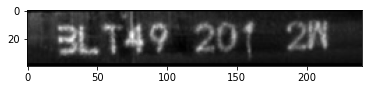

3LU134022A


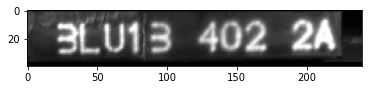

3LT421022A


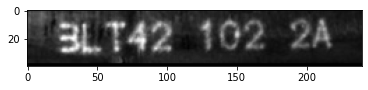

2FW824014A


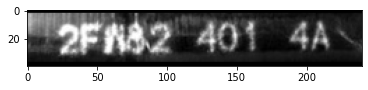

3LY233053T


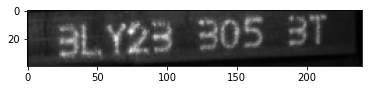

1WB875013F


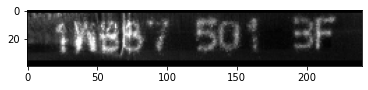

3LX006032A


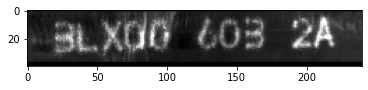

3LY153052A


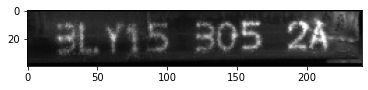

STEP:  38800 TRAIN loss CE: 2.22300, Correct ratio 0.97780, All correct: 0.84343
STEP:  38900 TRAIN loss CE: 2.30550, Correct ratio 0.97487, All correct: 0.82789
STEP:  39000 TRAIN loss CE: 2.29891, Correct ratio 0.97411, All correct: 0.82483
STEP:  39100 TRAIN loss CE: 2.32056, Correct ratio 0.97311, All correct: 0.82425
STEP:  39200 TRAIN loss CE: 2.27676, Correct ratio 0.97382, All correct: 0.82791
STEP:  39300 TRAIN loss CE: 2.29775, Correct ratio 0.97385, All correct: 0.82888
STEP:  39400 TRAIN loss CE: 2.25684, Correct ratio 0.97490, All correct: 0.83530
STEP:  39500 TRAIN loss CE: 2.23895, Correct ratio 0.97520, All correct: 0.83667
STEP:  39600 TRAIN loss CE: 2.22363, Correct ratio 0.97553, All correct: 0.83635
STEP:  39700 TRAIN loss CE: 2.23406, Correct ratio 0.97529, All correct: 0.83584
STEP:  39800 TRAIN loss CE: 2.23143, Correct ratio 0.97542, All correct: 0.83769
STEP:  39900 TRAIN loss CE: 2.22250, Correct ratio 0.97560, All correct: 0.83872
STEP:  40000 TRAIN loss CE: 

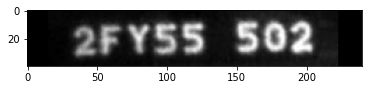

3LU483033K


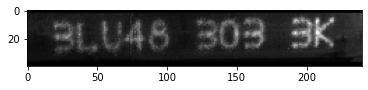

2G8172013F


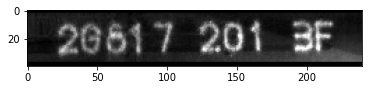

3LJ312021H


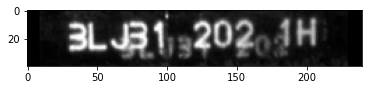

2FY07202


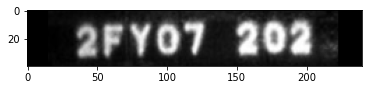

3LU746022F


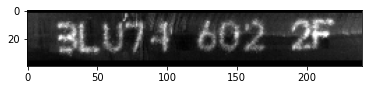

2FX04103


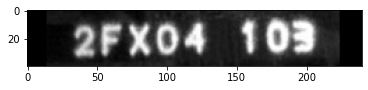

1W874304


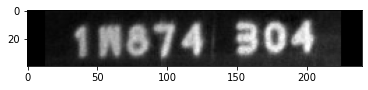

STEP:  40900 TRAIN loss CE: 1.73138, Correct ratio 0.98682, All correct: 0.88265
STEP:  41000 TRAIN loss CE: 1.94116, Correct ratio 0.98112, All correct: 0.88171
STEP:  41100 TRAIN loss CE: 1.99603, Correct ratio 0.97996, All correct: 0.87550
STEP:  41200 TRAIN loss CE: 2.09261, Correct ratio 0.97878, All correct: 0.86533
STEP:  41300 TRAIN loss CE: 2.07671, Correct ratio 0.97882, All correct: 0.86080
STEP:  41400 TRAIN loss CE: 2.07260, Correct ratio 0.97886, All correct: 0.86088
STEP:  41500 TRAIN loss CE: 2.10004, Correct ratio 0.97856, All correct: 0.85921
STEP:  41600 TRAIN loss CE: 2.08772, Correct ratio 0.97861, All correct: 0.85931
STEP:  41700 TRAIN loss CE: 2.09810, Correct ratio 0.97844, All correct: 0.85733
STEP:  41800 TRAIN loss CE: 2.08641, Correct ratio 0.97854, All correct: 0.85774
STEP:  41900 TRAIN loss CE: 2.07251, Correct ratio 0.97873, All correct: 0.85891
STEP:  42000 TRAIN loss CE: 2.07512, Correct ratio 0.97880, All correct: 0.85944
STEP:  42100 TRAIN loss CE: 

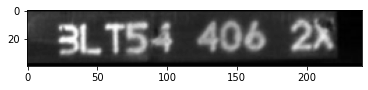

2FX273021A


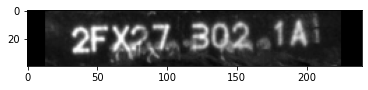

3LU063025T


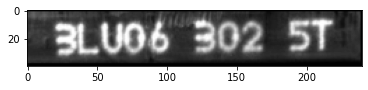

1WD404052A


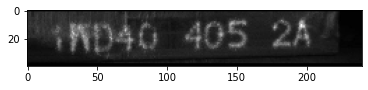

3L8599022


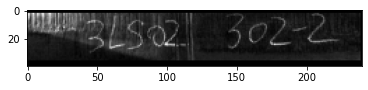

3LM512011T


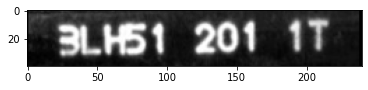

3LR29201


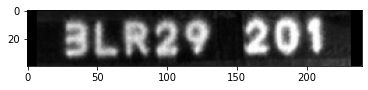

1W6314022A


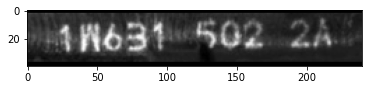

STEP:  43100 TRAIN loss CE: 1.96432, Correct ratio 0.98075, All correct: 0.87879
STEP:  43200 TRAIN loss CE: 2.01892, Correct ratio 0.98063, All correct: 0.87500
STEP:  43300 TRAIN loss CE: 2.06716, Correct ratio 0.97941, All correct: 0.86873
STEP:  43400 TRAIN loss CE: 2.08140, Correct ratio 0.97901, All correct: 0.87249
STEP:  43500 TRAIN loss CE: 2.02641, Correct ratio 0.98017, All correct: 0.87450
STEP:  43600 TRAIN loss CE: 1.99998, Correct ratio 0.98061, All correct: 0.87667
STEP:  43700 TRAIN loss CE: 2.00733, Correct ratio 0.98046, All correct: 0.87464
STEP:  43800 TRAIN loss CE: 2.01396, Correct ratio 0.98026, All correct: 0.87297
STEP:  43900 TRAIN loss CE: 2.03103, Correct ratio 0.97990, All correct: 0.87278
STEP:  44000 TRAIN loss CE: 2.01445, Correct ratio 0.98023, All correct: 0.87262
STEP:  44100 TRAIN loss CE: 2.01189, Correct ratio 0.98022, All correct: 0.87318
STEP:  44200 TRAIN loss CE: 2.00155, Correct ratio 0.98037, All correct: 0.87344
STEP:  44300 TRAIN loss CE: 

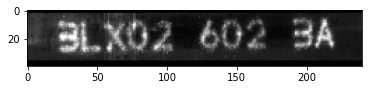

3LT412012A


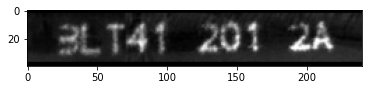

1W9043042A


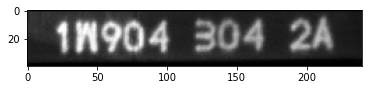

3M503202


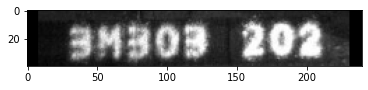

3LV57303


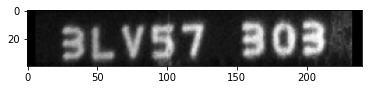

2FY132013H


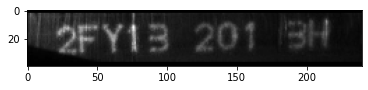

3LT453012A


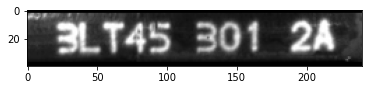

2FV692012H


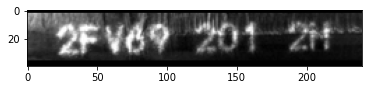

STEP:  45200 TRAIN loss CE: 2.01767, Correct ratio 0.98065, All correct: 0.88265
STEP:  45300 TRAIN loss CE: 1.98264, Correct ratio 0.98043, All correct: 0.87164
STEP:  45400 TRAIN loss CE: 1.99735, Correct ratio 0.97979, All correct: 0.86847
STEP:  45500 TRAIN loss CE: 1.99818, Correct ratio 0.97947, All correct: 0.87321
STEP:  45600 TRAIN loss CE: 2.00354, Correct ratio 0.97949, All correct: 0.87472
STEP:  45700 TRAIN loss CE: 2.00418, Correct ratio 0.97970, All correct: 0.87546
STEP:  45800 TRAIN loss CE: 1.99208, Correct ratio 0.97981, All correct: 0.87539
STEP:  45900 TRAIN loss CE: 1.98559, Correct ratio 0.97999, All correct: 0.87383
STEP:  46000 TRAIN loss CE: 1.98145, Correct ratio 0.98022, All correct: 0.87500
STEP:  46100 TRAIN loss CE: 1.95792, Correct ratio 0.98072, All correct: 0.87750
STEP:  46200 TRAIN loss CE: 1.96588, Correct ratio 0.98059, All correct: 0.87786
STEP:  46300 TRAIN loss CE: 1.96601, Correct ratio 0.98049, All correct: 0.87750
STEP:  46400 TRAIN loss CE: 

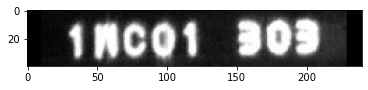

2G8161022F


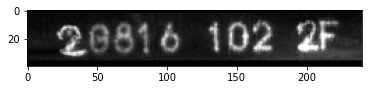

3LW305042Y


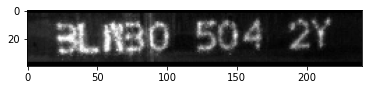

3LP563032F


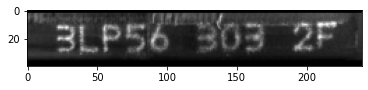

6SG748052T


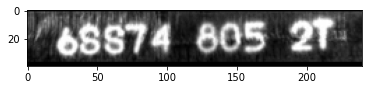

1WD01401


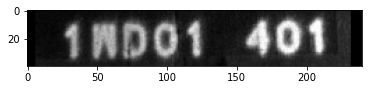

3LU48402


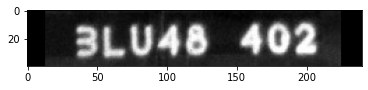

3LV284013A


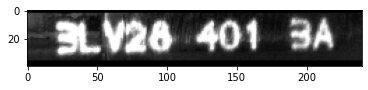

STEP:  47400 TRAIN loss CE: 1.80818, Correct ratio 0.98380, All correct: 0.89394
STEP:  47500 TRAIN loss CE: 1.84751, Correct ratio 0.98351, All correct: 0.88756
STEP:  47600 TRAIN loss CE: 1.84110, Correct ratio 0.98408, All correct: 0.89507
STEP:  47700 TRAIN loss CE: 1.88236, Correct ratio 0.98287, All correct: 0.89286
STEP:  47800 TRAIN loss CE: 1.89928, Correct ratio 0.98274, All correct: 0.89254
STEP:  47900 TRAIN loss CE: 1.88668, Correct ratio 0.98280, All correct: 0.89232
STEP:  48000 TRAIN loss CE: 1.89037, Correct ratio 0.98252, All correct: 0.89127
STEP:  48100 TRAIN loss CE: 1.89597, Correct ratio 0.98219, All correct: 0.88955
STEP:  48200 TRAIN loss CE: 1.87060, Correct ratio 0.98262, All correct: 0.89155
STEP:  48300 TRAIN loss CE: 1.87382, Correct ratio 0.98257, All correct: 0.89077
STEP:  48400 TRAIN loss CE: 1.85852, Correct ratio 0.98287, All correct: 0.89183
STEP:  48500 TRAIN loss CE: 1.86188, Correct ratio 0.98271, All correct: 0.89137
STEP:  48600 TRAIN loss CE: 

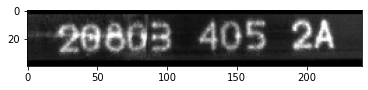

3LR932011T


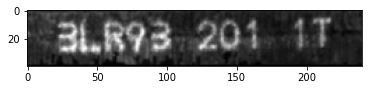

3LQ972014H


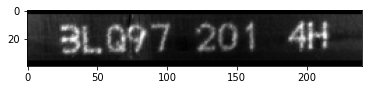

3LU69405


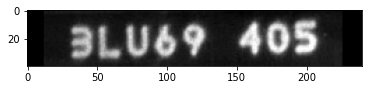

2G756402


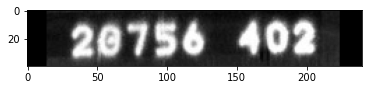

1W816402


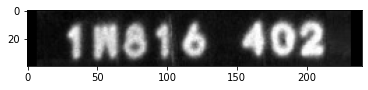

2FY82202


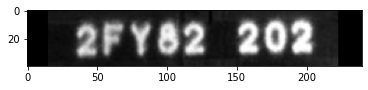

3LY16401


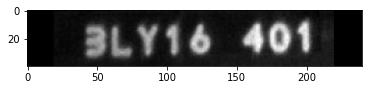

STEP:  49500 TRAIN loss CE: 1.86392, Correct ratio 0.98342, All correct: 0.90051
STEP:  49600 TRAIN loss CE: 1.85067, Correct ratio 0.98385, All correct: 0.90772
STEP:  49700 TRAIN loss CE: 1.90603, Correct ratio 0.98356, All correct: 0.90161
STEP:  49800 TRAIN loss CE: 1.86252, Correct ratio 0.98388, All correct: 0.90150
STEP:  49900 TRAIN loss CE: 1.81207, Correct ratio 0.98483, All correct: 0.90367
STEP:  50000 TRAIN loss CE: 1.78988, Correct ratio 0.98520, All correct: 0.90505
STEP:  50100 TRAIN loss CE: 1.80821, Correct ratio 0.98440, All correct: 0.90254
STEP:  50200 TRAIN loss CE: 1.78563, Correct ratio 0.98490, All correct: 0.90554
STEP:  50300 TRAIN loss CE: 1.77122, Correct ratio 0.98504, All correct: 0.90430
STEP:  50400 TRAIN loss CE: 1.78093, Correct ratio 0.98474, All correct: 0.90371
STEP:  50500 TRAIN loss CE: 1.77552, Correct ratio 0.98479, All correct: 0.90336
STEP:  50600 TRAIN loss CE: 1.77275, Correct ratio 0.98498, All correct: 0.90568
STEP:  50700 TRAIN loss CE: 

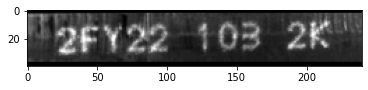

3LX486022A


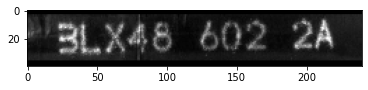

1WB293032K


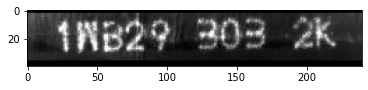

3LX025032A


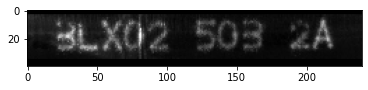

1VQ422013Y


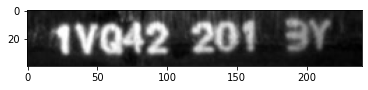

1WH005025Y


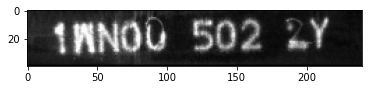

2G1476023N


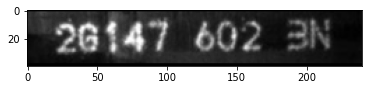

3M1704042A


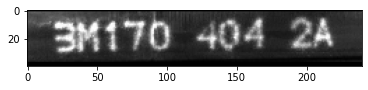

STEP:  51700 TRAIN loss CE: 1.92467, Correct ratio 0.98085, All correct: 0.89268
STEP:  51800 TRAIN loss CE: 1.78623, Correct ratio 0.98414, All correct: 0.90264
STEP:  51900 TRAIN loss CE: 1.79301, Correct ratio 0.98495, All correct: 0.90594
STEP:  52000 TRAIN loss CE: 1.82109, Correct ratio 0.98415, All correct: 0.90695
STEP:  52100 TRAIN loss CE: 1.77636, Correct ratio 0.98487, All correct: 0.90782
STEP:  52200 TRAIN loss CE: 1.75357, Correct ratio 0.98524, All correct: 0.90755
STEP:  52300 TRAIN loss CE: 1.74093, Correct ratio 0.98548, All correct: 0.90826
STEP:  52400 TRAIN loss CE: 1.76157, Correct ratio 0.98533, All correct: 0.90738
STEP:  52500 TRAIN loss CE: 1.77115, Correct ratio 0.98501, All correct: 0.90601
STEP:  52600 TRAIN loss CE: 1.76808, Correct ratio 0.98504, All correct: 0.90603
STEP:  52700 TRAIN loss CE: 1.76605, Correct ratio 0.98513, All correct: 0.90537
STEP:  52800 TRAIN loss CE: 1.76494, Correct ratio 0.98519, All correct: 0.90596
STEP:  52900 TRAIN loss CE: 

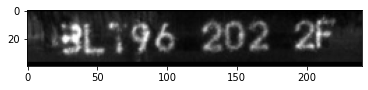

1WD185022F


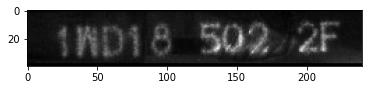

3LU254021A


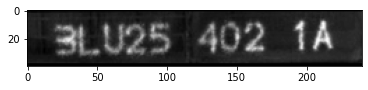

3LD656023F


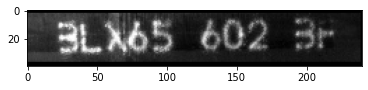

2G0883023A


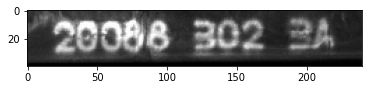

3M170304


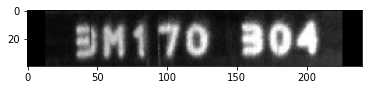

4P4371054F


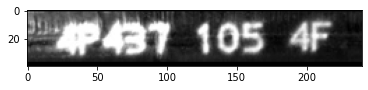

2G7925022F


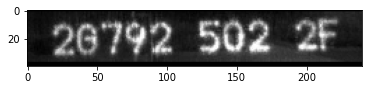

STEP:  53800 TRAIN loss CE: 2.13027, Correct ratio 0.97662, All correct: 0.87755
STEP:  53900 TRAIN loss CE: 1.96807, Correct ratio 0.98161, All correct: 0.89010
STEP:  54000 TRAIN loss CE: 1.91080, Correct ratio 0.98322, All correct: 0.89458
STEP:  54100 TRAIN loss CE: 1.86696, Correct ratio 0.98367, All correct: 0.90115
STEP:  54200 TRAIN loss CE: 1.82886, Correct ratio 0.98453, All correct: 0.90757
STEP:  54300 TRAIN loss CE: 1.79964, Correct ratio 0.98486, All correct: 0.90984
STEP:  54400 TRAIN loss CE: 1.80469, Correct ratio 0.98488, All correct: 0.90948
STEP:  54500 TRAIN loss CE: 1.81965, Correct ratio 0.98445, All correct: 0.90871
STEP:  54600 TRAIN loss CE: 1.79608, Correct ratio 0.98478, All correct: 0.90901
STEP:  54700 TRAIN loss CE: 1.77433, Correct ratio 0.98520, All correct: 0.91043
STEP:  54800 TRAIN loss CE: 1.77170, Correct ratio 0.98524, All correct: 0.91277
STEP:  54900 TRAIN loss CE: 1.76547, Correct ratio 0.98530, All correct: 0.91253
STEP:  55000 TRAIN loss CE: 

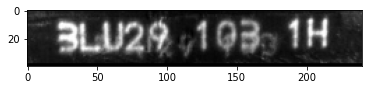

3LV573013K


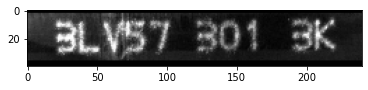

3LW29503


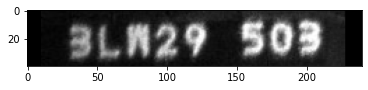

1WL484033F


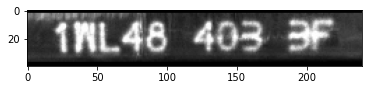

3LY163012A


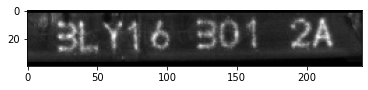

6SU538063A


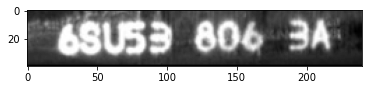

1W806102


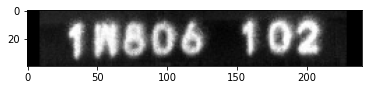

3LS111022Y


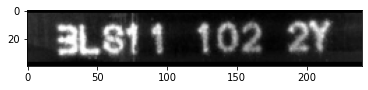

STEP:  56000 TRAIN loss CE: 1.66509, Correct ratio 0.98748, All correct: 0.91414
STEP:  56100 TRAIN loss CE: 1.65308, Correct ratio 0.98801, All correct: 0.92274
STEP:  56200 TRAIN loss CE: 1.62982, Correct ratio 0.98854, All correct: 0.92266
STEP:  56300 TRAIN loss CE: 1.63842, Correct ratio 0.98810, All correct: 0.92074
STEP:  56400 TRAIN loss CE: 1.61629, Correct ratio 0.98860, All correct: 0.92335
STEP:  56500 TRAIN loss CE: 1.63273, Correct ratio 0.98824, All correct: 0.91966
STEP:  56600 TRAIN loss CE: 1.63806, Correct ratio 0.98784, All correct: 0.91953
STEP:  56700 TRAIN loss CE: 1.67014, Correct ratio 0.98741, All correct: 0.91818
STEP:  56800 TRAIN loss CE: 1.67666, Correct ratio 0.98709, All correct: 0.91810
STEP:  56900 TRAIN loss CE: 1.65857, Correct ratio 0.98743, All correct: 0.91992
STEP:  57000 TRAIN loss CE: 1.67047, Correct ratio 0.98734, All correct: 0.92050
STEP:  57100 TRAIN loss CE: 1.68890, Correct ratio 0.98690, All correct: 0.91931
STEP:  57200 TRAIN loss CE: 

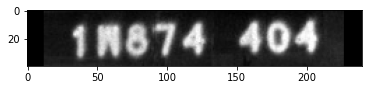

3LU48303


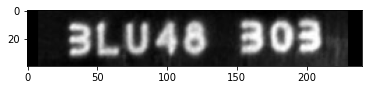

3LU133023T


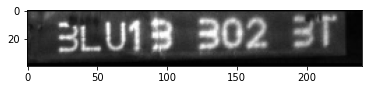

3LU051011


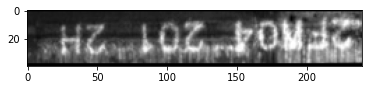

1W6874013A


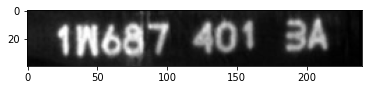

2FR603032H


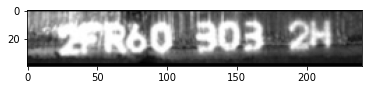

2G0663042A


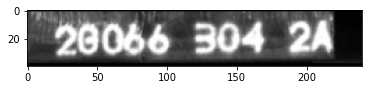

1W9044042A


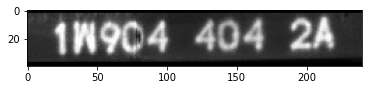

STEP:  58100 TRAIN loss CE: 1.64312, Correct ratio 0.98788, All correct: 0.92857
STEP:  58200 TRAIN loss CE: 1.47880, Correct ratio 0.99154, All correct: 0.94379
STEP:  58300 TRAIN loss CE: 1.59815, Correct ratio 0.98866, All correct: 0.93373
STEP:  58400 TRAIN loss CE: 1.59208, Correct ratio 0.98869, All correct: 0.93159
STEP:  58500 TRAIN loss CE: 1.58477, Correct ratio 0.98866, All correct: 0.93179
STEP:  58600 TRAIN loss CE: 1.58893, Correct ratio 0.98862, All correct: 0.93010
STEP:  58700 TRAIN loss CE: 1.58195, Correct ratio 0.98897, All correct: 0.93143
STEP:  58800 TRAIN loss CE: 1.58335, Correct ratio 0.98893, All correct: 0.93191
STEP:  58900 TRAIN loss CE: 1.58111, Correct ratio 0.98897, All correct: 0.93095
STEP:  59000 TRAIN loss CE: 1.58446, Correct ratio 0.98879, All correct: 0.93085
STEP:  59100 TRAIN loss CE: 1.59708, Correct ratio 0.98861, All correct: 0.93017
STEP:  59200 TRAIN loss CE: 1.60039, Correct ratio 0.98850, All correct: 0.92940
STEP:  59300 TRAIN loss CE: 

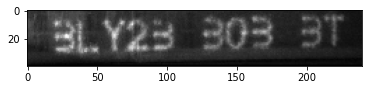

1WB764022A


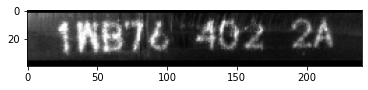

3LM06303


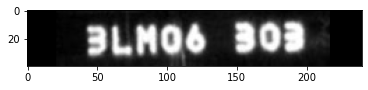

3LU20403


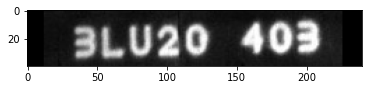

1WL983032A


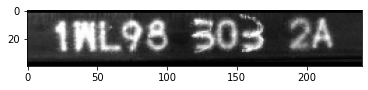

1WL984023A


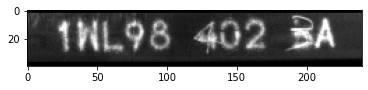

2FW844021F


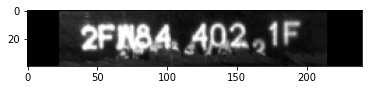

3LV503032A


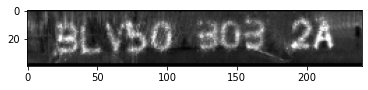

STEP:  60300 TRAIN loss CE: 1.71348, Correct ratio 0.98590, All correct: 0.91667
STEP:  60400 TRAIN loss CE: 1.78466, Correct ratio 0.98571, All correct: 0.92651
STEP:  60500 TRAIN loss CE: 1.72749, Correct ratio 0.98652, All correct: 0.93018
STEP:  60600 TRAIN loss CE: 1.69879, Correct ratio 0.98695, All correct: 0.92982
STEP:  60700 TRAIN loss CE: 1.66435, Correct ratio 0.98764, All correct: 0.92961
STEP:  60800 TRAIN loss CE: 1.64478, Correct ratio 0.98798, All correct: 0.92863
STEP:  60900 TRAIN loss CE: 1.62377, Correct ratio 0.98833, All correct: 0.92972
STEP:  61000 TRAIN loss CE: 1.61689, Correct ratio 0.98842, All correct: 0.92944
STEP:  61100 TRAIN loss CE: 1.62538, Correct ratio 0.98822, All correct: 0.92798
STEP:  61200 TRAIN loss CE: 1.61130, Correct ratio 0.98848, All correct: 0.92905
STEP:  61300 TRAIN loss CE: 1.60816, Correct ratio 0.98857, All correct: 0.92982
STEP:  61400 TRAIN loss CE: 1.60571, Correct ratio 0.98858, All correct: 0.92973
STEP:  61500 TRAIN loss CE: 

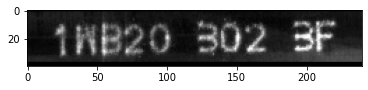

2FT026013Y


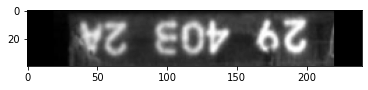

1W8472022F


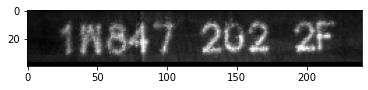

1WL99405


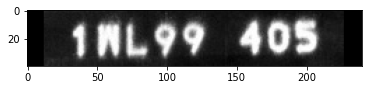

1WB184022Y


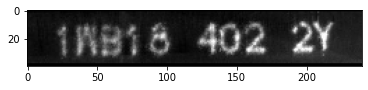

1W6433022A


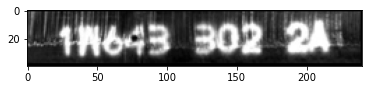

3LP891032F


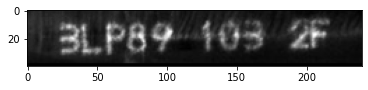

3M1794013A


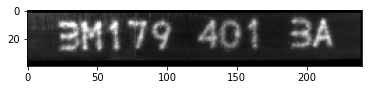

STEP:  62400 TRAIN loss CE: 1.86233, Correct ratio 0.98427, All correct: 0.92602
STEP:  62500 TRAIN loss CE: 1.77482, Correct ratio 0.98693, All correct: 0.92869
STEP:  62600 TRAIN loss CE: 1.67989, Correct ratio 0.98799, All correct: 0.92721
STEP:  62700 TRAIN loss CE: 1.60649, Correct ratio 0.98920, All correct: 0.93123
STEP:  62800 TRAIN loss CE: 1.57592, Correct ratio 0.98977, All correct: 0.93430
STEP:  62900 TRAIN loss CE: 1.55161, Correct ratio 0.99013, All correct: 0.93488
STEP:  63000 TRAIN loss CE: 1.54252, Correct ratio 0.99032, All correct: 0.93721
STEP:  63100 TRAIN loss CE: 1.54289, Correct ratio 0.99010, All correct: 0.93692
STEP:  63200 TRAIN loss CE: 1.56955, Correct ratio 0.98964, All correct: 0.93581
STEP:  63300 TRAIN loss CE: 1.58032, Correct ratio 0.98937, All correct: 0.93401
STEP:  63400 TRAIN loss CE: 1.57634, Correct ratio 0.98928, All correct: 0.93410
STEP:  63500 TRAIN loss CE: 1.57946, Correct ratio 0.98919, All correct: 0.93494
STEP:  63600 TRAIN loss CE: 

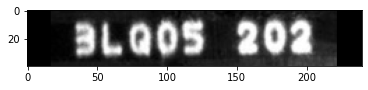

1WA78303


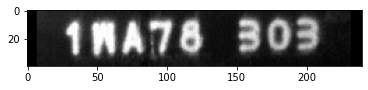

2FZ434041A


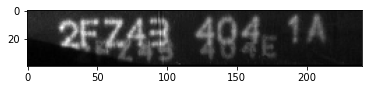

1WE245022A


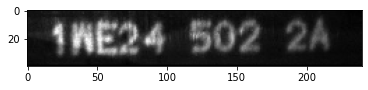

3LS815012A


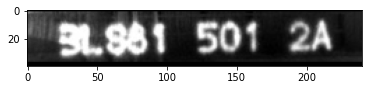

3LU484044K


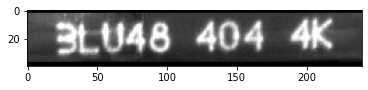

3LY153032A


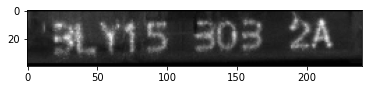

1WB284032F


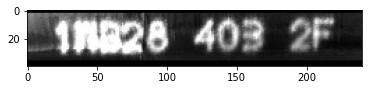

STEP:  64600 TRAIN loss CE: 1.48946, Correct ratio 0.99053, All correct: 0.93056
STEP:  64700 TRAIN loss CE: 1.48101, Correct ratio 0.99084, All correct: 0.93467
STEP:  64800 TRAIN loss CE: 1.49934, Correct ratio 0.99066, All correct: 0.93729
STEP:  64900 TRAIN loss CE: 1.50062, Correct ratio 0.99055, All correct: 0.93734
STEP:  65000 TRAIN loss CE: 1.51265, Correct ratio 0.99017, All correct: 0.93712
STEP:  65100 TRAIN loss CE: 1.49268, Correct ratio 0.99070, All correct: 0.93969
STEP:  65200 TRAIN loss CE: 1.50043, Correct ratio 0.99048, All correct: 0.93991
STEP:  65300 TRAIN loss CE: 1.51754, Correct ratio 0.99012, All correct: 0.93773
STEP:  65400 TRAIN loss CE: 1.53008, Correct ratio 0.98993, All correct: 0.93743
STEP:  65500 TRAIN loss CE: 1.56156, Correct ratio 0.98948, All correct: 0.93631
STEP:  65600 TRAIN loss CE: 1.55167, Correct ratio 0.98965, All correct: 0.93619
STEP:  65700 TRAIN loss CE: 1.54294, Correct ratio 0.98990, All correct: 0.93766
STEP:  65800 TRAIN loss CE: 

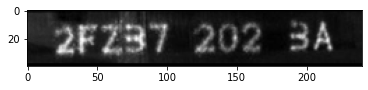

2G146601


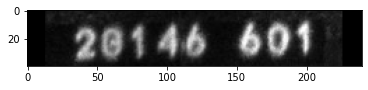

2FZ052032F


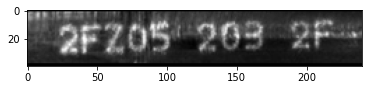

1WB74401


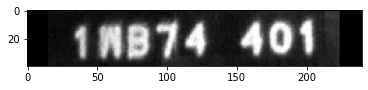

1W5651013A


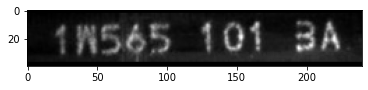

3LP394033A


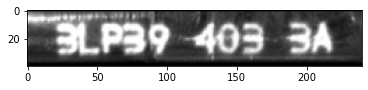

1WC545033A


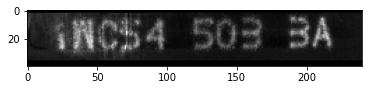

1W395603


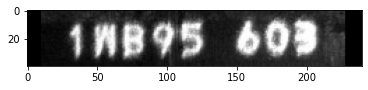

STEP:  66700 TRAIN loss CE: 1.58977, Correct ratio 0.98767, All correct: 0.93367
STEP:  66800 TRAIN loss CE: 1.46273, Correct ratio 0.99070, All correct: 0.94547
STEP:  66900 TRAIN loss CE: 1.44632, Correct ratio 0.99151, All correct: 0.94729
STEP:  67000 TRAIN loss CE: 1.46352, Correct ratio 0.99102, All correct: 0.94269
STEP:  67100 TRAIN loss CE: 1.48459, Correct ratio 0.99112, All correct: 0.94432
STEP:  67200 TRAIN loss CE: 1.50140, Correct ratio 0.99072, All correct: 0.94148
STEP:  67300 TRAIN loss CE: 1.51217, Correct ratio 0.99048, All correct: 0.93952
STEP:  67400 TRAIN loss CE: 1.49524, Correct ratio 0.99082, All correct: 0.94109
STEP:  67500 TRAIN loss CE: 1.50077, Correct ratio 0.99069, All correct: 0.94096
STEP:  67600 TRAIN loss CE: 1.52069, Correct ratio 0.99035, All correct: 0.94020
STEP:  67700 TRAIN loss CE: 1.52754, Correct ratio 0.99023, All correct: 0.94042
STEP:  67800 TRAIN loss CE: 1.52683, Correct ratio 0.99031, All correct: 0.94060
STEP:  67900 TRAIN loss CE: 

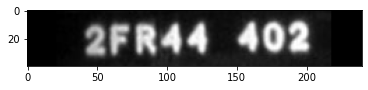

3LS111012A


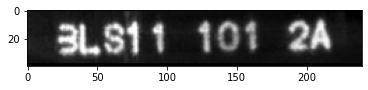

2G1465012F


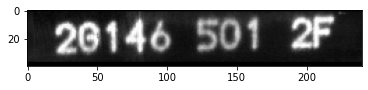

3LT643072L


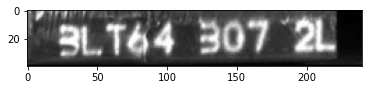

3LT236022A


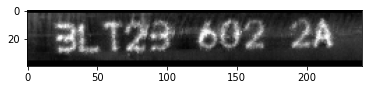

3M088404


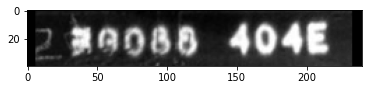

1WB274032F


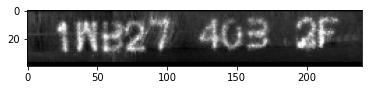

3LS77402


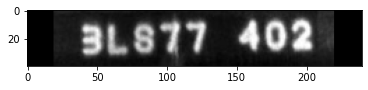

STEP:  68900 TRAIN loss CE: 1.74228, Correct ratio 0.98601, All correct: 0.92677
STEP:  69000 TRAIN loss CE: 1.57001, Correct ratio 0.98958, All correct: 0.93907
STEP:  69100 TRAIN loss CE: 1.50369, Correct ratio 0.99105, All correct: 0.94523
STEP:  69200 TRAIN loss CE: 1.51621, Correct ratio 0.99063, All correct: 0.94267
STEP:  69300 TRAIN loss CE: 1.55359, Correct ratio 0.98977, All correct: 0.94138
STEP:  69400 TRAIN loss CE: 1.55276, Correct ratio 0.98972, All correct: 0.94220
STEP:  69500 TRAIN loss CE: 1.52775, Correct ratio 0.99024, All correct: 0.94313
STEP:  69600 TRAIN loss CE: 1.52825, Correct ratio 0.99021, All correct: 0.94352
STEP:  69700 TRAIN loss CE: 1.52838, Correct ratio 0.99024, All correct: 0.94397
STEP:  69800 TRAIN loss CE: 1.52693, Correct ratio 0.99025, All correct: 0.94469
STEP:  69900 TRAIN loss CE: 1.52580, Correct ratio 0.99035, All correct: 0.94450
STEP:  70000 TRAIN loss CE: 1.51365, Correct ratio 0.99057, All correct: 0.94548
STEP:  70100 TRAIN loss CE: 

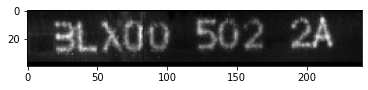

2FX752022H


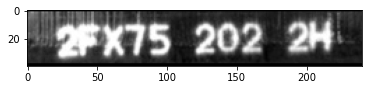

3LP542041H


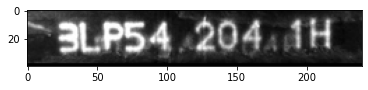

3LW111013A


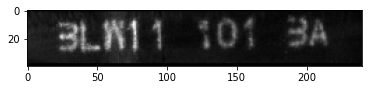

2FX274022A


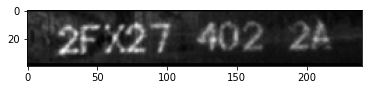

3LT644023L


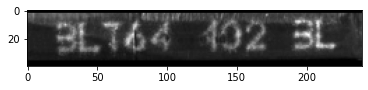

1WB504013H


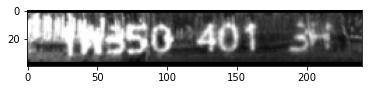

3LY144023A


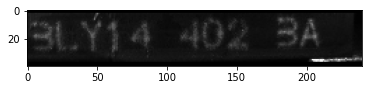

STEP:  71000 TRAIN loss CE: 1.61155, Correct ratio 0.99107, All correct: 0.94898
STEP:  71100 TRAIN loss CE: 1.51584, Correct ratio 0.99140, All correct: 0.94631
STEP:  71200 TRAIN loss CE: 1.49266, Correct ratio 0.99163, All correct: 0.94729
STEP:  71300 TRAIN loss CE: 1.47536, Correct ratio 0.99167, All correct: 0.94699
STEP:  71400 TRAIN loss CE: 1.47877, Correct ratio 0.99144, All correct: 0.94543
STEP:  71500 TRAIN loss CE: 1.48079, Correct ratio 0.99158, All correct: 0.94604
STEP:  71600 TRAIN loss CE: 1.49928, Correct ratio 0.99095, All correct: 0.94376
STEP:  71700 TRAIN loss CE: 1.48793, Correct ratio 0.99110, All correct: 0.94476
STEP:  71800 TRAIN loss CE: 1.48720, Correct ratio 0.99110, All correct: 0.94420
STEP:  71900 TRAIN loss CE: 1.47459, Correct ratio 0.99144, All correct: 0.94639
STEP:  72000 TRAIN loss CE: 1.47290, Correct ratio 0.99149, All correct: 0.94733
STEP:  72100 TRAIN loss CE: 1.46587, Correct ratio 0.99151, All correct: 0.94735
STEP:  72200 TRAIN loss CE: 

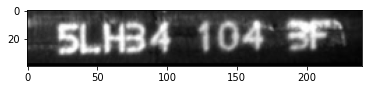

1W6562031H


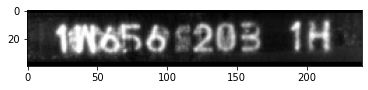

2FW284063K


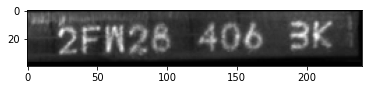

1WL554032A


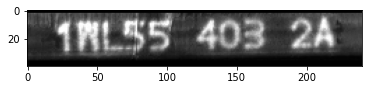

2FR302021H


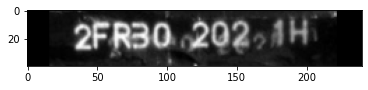

3LT255023A


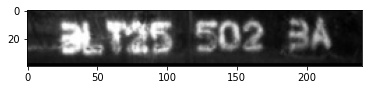

1WB30301


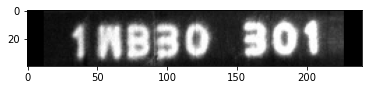

3LT45304


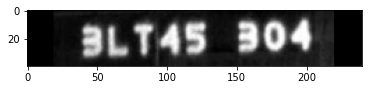

STEP:  73200 TRAIN loss CE: 1.39755, Correct ratio 0.99253, All correct: 0.95833
STEP:  73300 TRAIN loss CE: 1.34493, Correct ratio 0.99388, All correct: 0.96106
STEP:  73400 TRAIN loss CE: 1.39466, Correct ratio 0.99258, All correct: 0.95485
STEP:  73500 TRAIN loss CE: 1.44008, Correct ratio 0.99139, All correct: 0.95301
STEP:  73600 TRAIN loss CE: 1.41952, Correct ratio 0.99188, All correct: 0.95566
STEP:  73700 TRAIN loss CE: 1.41825, Correct ratio 0.99212, All correct: 0.95555
STEP:  73800 TRAIN loss CE: 1.42723, Correct ratio 0.99218, All correct: 0.95565
STEP:  73900 TRAIN loss CE: 1.42336, Correct ratio 0.99213, All correct: 0.95479
STEP:  74000 TRAIN loss CE: 1.42119, Correct ratio 0.99229, All correct: 0.95467
STEP:  74100 TRAIN loss CE: 1.43849, Correct ratio 0.99211, All correct: 0.95408
STEP:  74200 TRAIN loss CE: 1.44595, Correct ratio 0.99193, All correct: 0.95291
STEP:  74300 TRAIN loss CE: 1.44801, Correct ratio 0.99187, All correct: 0.95246
STEP:  74400 TRAIN loss CE: 

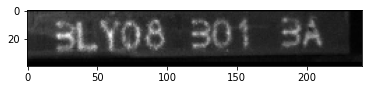

3LP40203


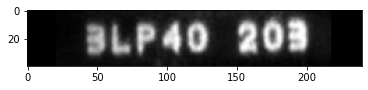

3LT422032A


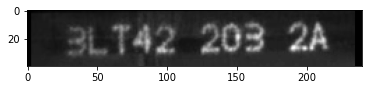

3LQ881012F


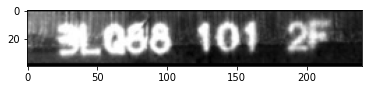

2G059102


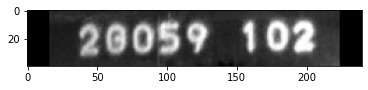

3LS165012F


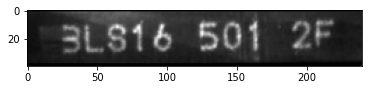

1WM074022A


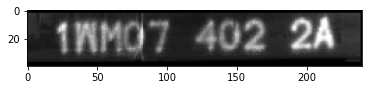

1WA102032F


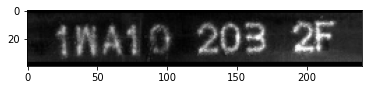

STEP:  75300 TRAIN loss CE: 1.56756, Correct ratio 0.99107, All correct: 0.96429
STEP:  75400 TRAIN loss CE: 1.54350, Correct ratio 0.99028, All correct: 0.94631
STEP:  75500 TRAIN loss CE: 1.57228, Correct ratio 0.98933, All correct: 0.94076
STEP:  75600 TRAIN loss CE: 1.51181, Correct ratio 0.99057, All correct: 0.94628
STEP:  75700 TRAIN loss CE: 1.48474, Correct ratio 0.99116, All correct: 0.94850
STEP:  75800 TRAIN loss CE: 1.47495, Correct ratio 0.99135, All correct: 0.94832
STEP:  75900 TRAIN loss CE: 1.46123, Correct ratio 0.99154, All correct: 0.95050
STEP:  76000 TRAIN loss CE: 1.45849, Correct ratio 0.99159, All correct: 0.95244
STEP:  76100 TRAIN loss CE: 1.45101, Correct ratio 0.99169, All correct: 0.95230
STEP:  76200 TRAIN loss CE: 1.45261, Correct ratio 0.99169, All correct: 0.95205
STEP:  76300 TRAIN loss CE: 1.46494, Correct ratio 0.99138, All correct: 0.95043
STEP:  76400 TRAIN loss CE: 1.46596, Correct ratio 0.99137, All correct: 0.95017
STEP:  76500 TRAIN loss CE: 

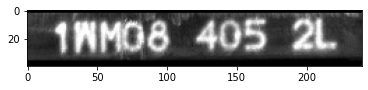

1WB97501


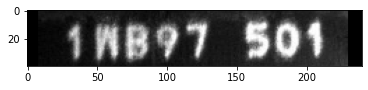

3LX63603


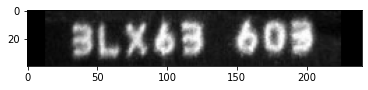

3LM751021H


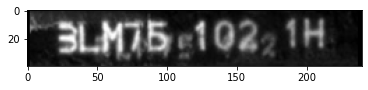

3LU214035T


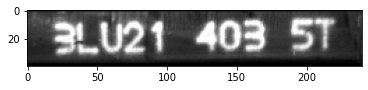

2FZ07103E


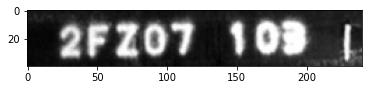

2FU97303


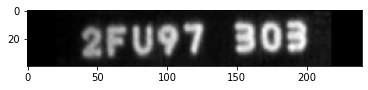

1WL713042F


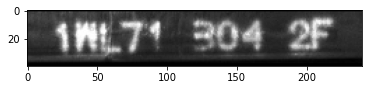

STEP:  77500 TRAIN loss CE: 1.40907, Correct ratio 0.99221, All correct: 0.94823
STEP:  77600 TRAIN loss CE: 1.41722, Correct ratio 0.99272, All correct: 0.95163
STEP:  77700 TRAIN loss CE: 1.39627, Correct ratio 0.99300, All correct: 0.95151
STEP:  77800 TRAIN loss CE: 1.41159, Correct ratio 0.99246, All correct: 0.95207
STEP:  77900 TRAIN loss CE: 1.41385, Correct ratio 0.99263, All correct: 0.95416
STEP:  78000 TRAIN loss CE: 1.43608, Correct ratio 0.99233, All correct: 0.95284
STEP:  78100 TRAIN loss CE: 1.43112, Correct ratio 0.99255, All correct: 0.95422
STEP:  78200 TRAIN loss CE: 1.41637, Correct ratio 0.99276, All correct: 0.95494
STEP:  78300 TRAIN loss CE: 1.42158, Correct ratio 0.99269, All correct: 0.95412
STEP:  78400 TRAIN loss CE: 1.42654, Correct ratio 0.99259, All correct: 0.95333
STEP:  78500 TRAIN loss CE: 1.42576, Correct ratio 0.99252, All correct: 0.95280
STEP:  78600 TRAIN loss CE: 1.43322, Correct ratio 0.99238, All correct: 0.95204
STEP:  78700 TRAIN loss CE: 

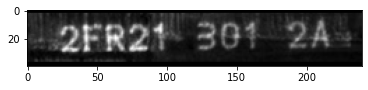

3LT256012A


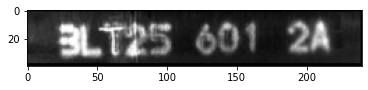

2G141406


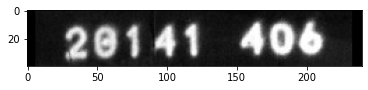

1WA744032F


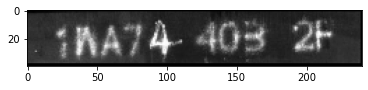

2G0884032A


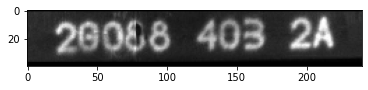

1W8935032Y


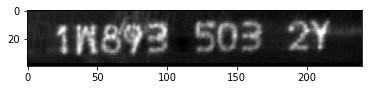

3LM431042A


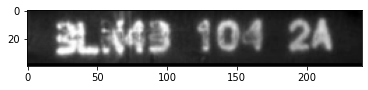

2G0673052L


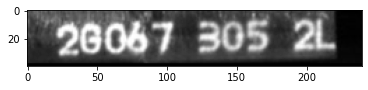

STEP:  79600 TRAIN loss CE: 1.34197, Correct ratio 0.99426, All correct: 0.96429
STEP:  79700 TRAIN loss CE: 1.33448, Correct ratio 0.99392, All correct: 0.95805
STEP:  79800 TRAIN loss CE: 1.41557, Correct ratio 0.99222, All correct: 0.95482
STEP:  79900 TRAIN loss CE: 1.42895, Correct ratio 0.99257, All correct: 0.95774
STEP:  80000 TRAIN loss CE: 1.40709, Correct ratio 0.99316, All correct: 0.95963
STEP:  80100 TRAIN loss CE: 1.40196, Correct ratio 0.99311, All correct: 0.95742
STEP:  80200 TRAIN loss CE: 1.39155, Correct ratio 0.99334, All correct: 0.95686
STEP:  80300 TRAIN loss CE: 1.37950, Correct ratio 0.99355, All correct: 0.95811
STEP:  80400 TRAIN loss CE: 1.37910, Correct ratio 0.99363, All correct: 0.95892
STEP:  80500 TRAIN loss CE: 1.37025, Correct ratio 0.99376, All correct: 0.95877
STEP:  80600 TRAIN loss CE: 1.37170, Correct ratio 0.99382, All correct: 0.95877
STEP:  80700 TRAIN loss CE: 1.38422, Correct ratio 0.99368, All correct: 0.95855
STEP:  80800 TRAIN loss CE: 

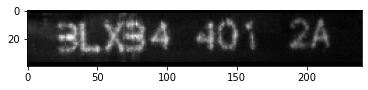

2G756303


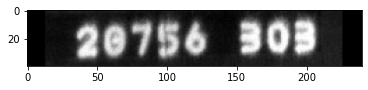

2FU821021F


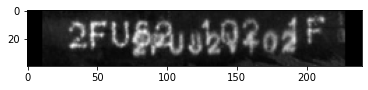

3LR042021F


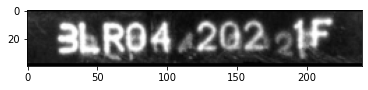

2FY582022F


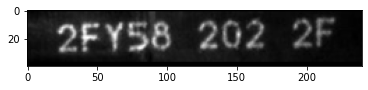

1WA021012A


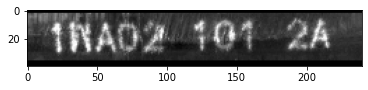

2FY812012X


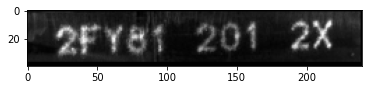

1W8163043A


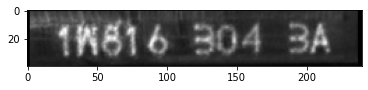

STEP:  81800 TRAIN loss CE: 1.45002, Correct ratio 0.99221, All correct: 0.95202
STEP:  81900 TRAIN loss CE: 1.37614, Correct ratio 0.99351, All correct: 0.95917
STEP:  82000 TRAIN loss CE: 1.38219, Correct ratio 0.99331, All correct: 0.95569
STEP:  82100 TRAIN loss CE: 1.39875, Correct ratio 0.99319, All correct: 0.95739
STEP:  82200 TRAIN loss CE: 1.40585, Correct ratio 0.99301, All correct: 0.95792
STEP:  82300 TRAIN loss CE: 1.42214, Correct ratio 0.99266, All correct: 0.95743
STEP:  82400 TRAIN loss CE: 1.42767, Correct ratio 0.99246, All correct: 0.95547
STEP:  82500 TRAIN loss CE: 1.42077, Correct ratio 0.99254, All correct: 0.95541
STEP:  82600 TRAIN loss CE: 1.41142, Correct ratio 0.99262, All correct: 0.95565
STEP:  82700 TRAIN loss CE: 1.40909, Correct ratio 0.99268, All correct: 0.95571
STEP:  82800 TRAIN loss CE: 1.42417, Correct ratio 0.99254, All correct: 0.95519
STEP:  82900 TRAIN loss CE: 1.42411, Correct ratio 0.99262, All correct: 0.95590
STEP:  83000 TRAIN loss CE: 

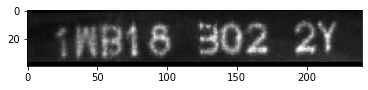

3LU745022F


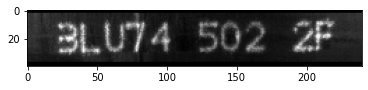

3LP28301


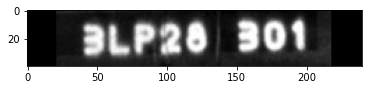

3LU203045T


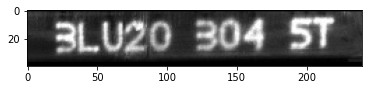

2G114404


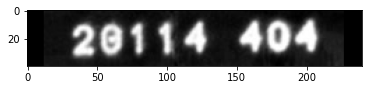

3LX186022F


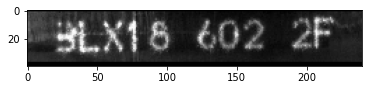

1W9044043A


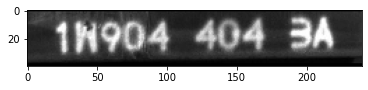

1W2231032H


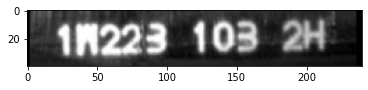

STEP:  83900 TRAIN loss CE: 1.50302, Correct ratio 0.99128, All correct: 0.94388
STEP:  84000 TRAIN loss CE: 1.40050, Correct ratio 0.99357, All correct: 0.95973
STEP:  84100 TRAIN loss CE: 1.37456, Correct ratio 0.99381, All correct: 0.95884
STEP:  84200 TRAIN loss CE: 1.36853, Correct ratio 0.99400, All correct: 0.96239
STEP:  84300 TRAIN loss CE: 1.34955, Correct ratio 0.99420, All correct: 0.96214
STEP:  84400 TRAIN loss CE: 1.33583, Correct ratio 0.99444, All correct: 0.96311
STEP:  84500 TRAIN loss CE: 1.34821, Correct ratio 0.99411, All correct: 0.96090
STEP:  84600 TRAIN loss CE: 1.33884, Correct ratio 0.99413, All correct: 0.96111
STEP:  84700 TRAIN loss CE: 1.35676, Correct ratio 0.99369, All correct: 0.95981
STEP:  84800 TRAIN loss CE: 1.38618, Correct ratio 0.99326, All correct: 0.95917
STEP:  84900 TRAIN loss CE: 1.38451, Correct ratio 0.99329, All correct: 0.95984
STEP:  85000 TRAIN loss CE: 1.38408, Correct ratio 0.99344, All correct: 0.96094
STEP:  85100 TRAIN loss CE: 

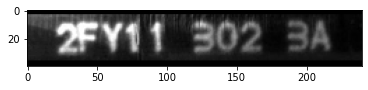

2FY072023F


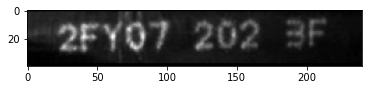

3LR325033X


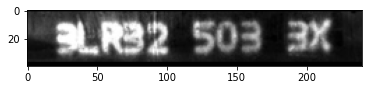

1WA804012F


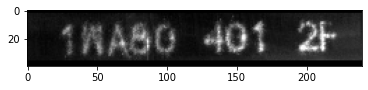

3LV481022Y


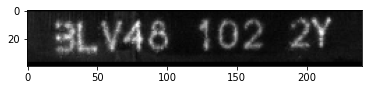

1WD543043T


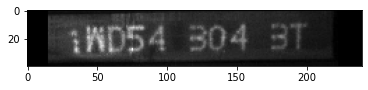

3LT144033A


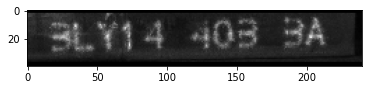

2FU811012F


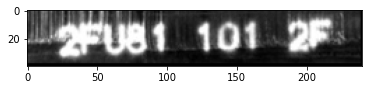

STEP:  86100 TRAIN loss CE: 1.53367, Correct ratio 0.99179, All correct: 0.95455
STEP:  86200 TRAIN loss CE: 1.40194, Correct ratio 0.99351, All correct: 0.96420
STEP:  86300 TRAIN loss CE: 1.37707, Correct ratio 0.99401, All correct: 0.96488
STEP:  86400 TRAIN loss CE: 1.39933, Correct ratio 0.99347, All correct: 0.96241
STEP:  86500 TRAIN loss CE: 1.38297, Correct ratio 0.99355, All correct: 0.96268
STEP:  86600 TRAIN loss CE: 1.37641, Correct ratio 0.99365, All correct: 0.96265
STEP:  86700 TRAIN loss CE: 1.37878, Correct ratio 0.99355, All correct: 0.96155
STEP:  86800 TRAIN loss CE: 1.36523, Correct ratio 0.99375, All correct: 0.96183
STEP:  86900 TRAIN loss CE: 1.37839, Correct ratio 0.99351, All correct: 0.96135
STEP:  87000 TRAIN loss CE: 1.36459, Correct ratio 0.99376, All correct: 0.96234
STEP:  87100 TRAIN loss CE: 1.35793, Correct ratio 0.99388, All correct: 0.96235
STEP:  87200 TRAIN loss CE: 1.38019, Correct ratio 0.99353, All correct: 0.96059
STEP:  87300 TRAIN loss CE: 

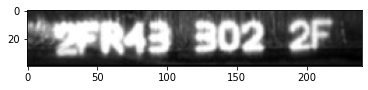

1WC024022L


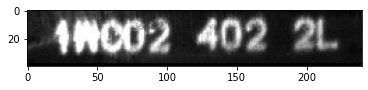

3LT305013A


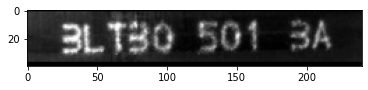

2G146602


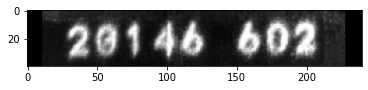

3M754102


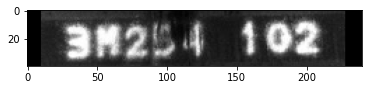

6SY090011T


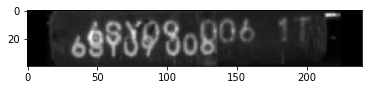

1W9171022Y


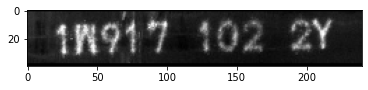

1WB203012F


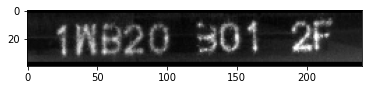

STEP:  88200 TRAIN loss CE: 1.48776, Correct ratio 0.99086, All correct: 0.94643
STEP:  88300 TRAIN loss CE: 1.35193, Correct ratio 0.99392, All correct: 0.96309
STEP:  88400 TRAIN loss CE: 1.43557, Correct ratio 0.99268, All correct: 0.96084
STEP:  88500 TRAIN loss CE: 1.39502, Correct ratio 0.99349, All correct: 0.96347
STEP:  88600 TRAIN loss CE: 1.37966, Correct ratio 0.99383, All correct: 0.96269
STEP:  88700 TRAIN loss CE: 1.36722, Correct ratio 0.99391, All correct: 0.96380
STEP:  88800 TRAIN loss CE: 1.36910, Correct ratio 0.99393, All correct: 0.96341
STEP:  88900 TRAIN loss CE: 1.37260, Correct ratio 0.99391, All correct: 0.96312
STEP:  89000 TRAIN loss CE: 1.35874, Correct ratio 0.99412, All correct: 0.96437
STEP:  89100 TRAIN loss CE: 1.35413, Correct ratio 0.99420, All correct: 0.96457
STEP:  89200 TRAIN loss CE: 1.35044, Correct ratio 0.99423, All correct: 0.96485
STEP:  89300 TRAIN loss CE: 1.35438, Correct ratio 0.99418, All correct: 0.96475
STEP:  89400 TRAIN loss CE: 

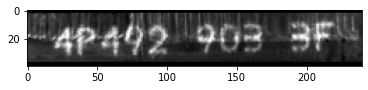

2FZ38202


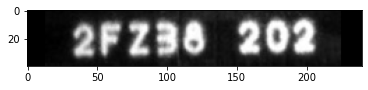

1W903302


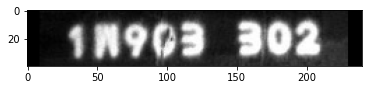

3LT543052X


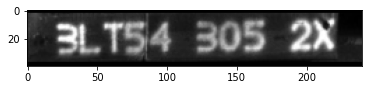

2FN81403


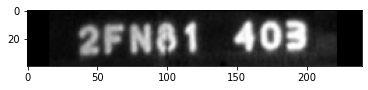

3LW295023F


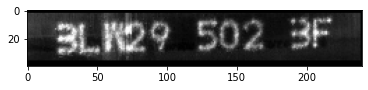

1WB214033F


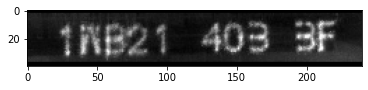

3LW853032F


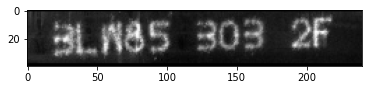

STEP:  90400 TRAIN loss CE: 1.21365, Correct ratio 0.99737, All correct: 0.97727
STEP:  90500 TRAIN loss CE: 1.32176, Correct ratio 0.99466, All correct: 0.96608
STEP:  90600 TRAIN loss CE: 1.32475, Correct ratio 0.99439, All correct: 0.96446
STEP:  90700 TRAIN loss CE: 1.32411, Correct ratio 0.99452, All correct: 0.96554
STEP:  90800 TRAIN loss CE: 1.31733, Correct ratio 0.99461, All correct: 0.96618
STEP:  90900 TRAIN loss CE: 1.32139, Correct ratio 0.99457, All correct: 0.96703
STEP:  91000 TRAIN loss CE: 1.33026, Correct ratio 0.99443, All correct: 0.96710
STEP:  91100 TRAIN loss CE: 1.33775, Correct ratio 0.99433, All correct: 0.96527
STEP:  91200 TRAIN loss CE: 1.33512, Correct ratio 0.99434, All correct: 0.96510
STEP:  91300 TRAIN loss CE: 1.33922, Correct ratio 0.99430, All correct: 0.96534
STEP:  91400 TRAIN loss CE: 1.33449, Correct ratio 0.99438, All correct: 0.96565
STEP:  91500 TRAIN loss CE: 1.33624, Correct ratio 0.99438, All correct: 0.96601
STEP:  91600 TRAIN loss CE: 

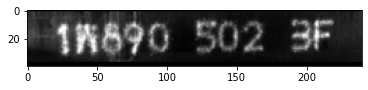

3LX32403


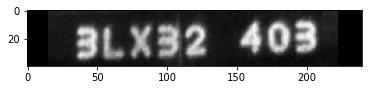

2LK842011


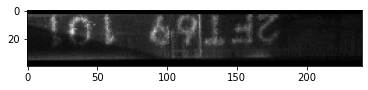

3LX41502


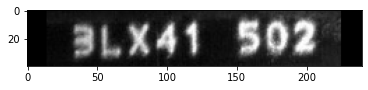

1W7694023A


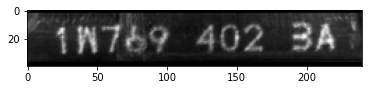

6SU537032A


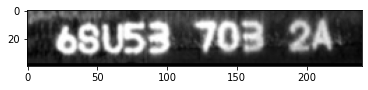

1W883601


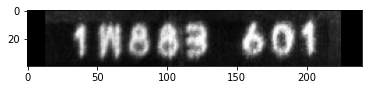

2FX59303


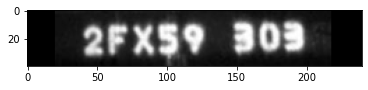

STEP:  92500 TRAIN loss CE: 1.47822, Correct ratio 0.99150, All correct: 0.95918
STEP:  92600 TRAIN loss CE: 1.48813, Correct ratio 0.99189, All correct: 0.95973
STEP:  92700 TRAIN loss CE: 1.41415, Correct ratio 0.99280, All correct: 0.96034
STEP:  92800 TRAIN loss CE: 1.35087, Correct ratio 0.99415, All correct: 0.96597
STEP:  92900 TRAIN loss CE: 1.37775, Correct ratio 0.99360, All correct: 0.96186
STEP:  93000 TRAIN loss CE: 1.39160, Correct ratio 0.99321, All correct: 0.95993
STEP:  93100 TRAIN loss CE: 1.39407, Correct ratio 0.99327, All correct: 0.96052
STEP:  93200 TRAIN loss CE: 1.38036, Correct ratio 0.99353, All correct: 0.96145
STEP:  93300 TRAIN loss CE: 1.36698, Correct ratio 0.99374, All correct: 0.96187
STEP:  93400 TRAIN loss CE: 1.35681, Correct ratio 0.99397, All correct: 0.96220
STEP:  93500 TRAIN loss CE: 1.35546, Correct ratio 0.99406, All correct: 0.96330
STEP:  93600 TRAIN loss CE: 1.35900, Correct ratio 0.99404, All correct: 0.96356
STEP:  93700 TRAIN loss CE: 

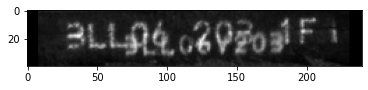

2G1593053A


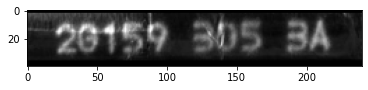

1WB213032F


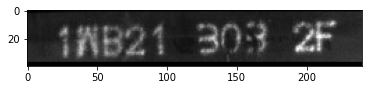

3LX63602


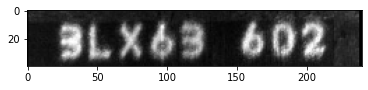

1V567102


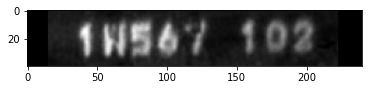

2FT432013F


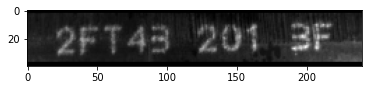

2FX031013F


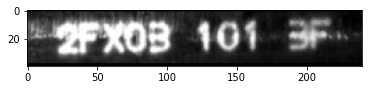

3LT256032A


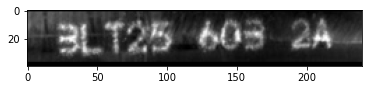

STEP:  94700 TRAIN loss CE: 1.35990, Correct ratio 0.99453, All correct: 0.95833
STEP:  94800 TRAIN loss CE: 1.35348, Correct ratio 0.99393, All correct: 0.95666
STEP:  94900 TRAIN loss CE: 1.32058, Correct ratio 0.99477, All correct: 0.96321
STEP:  95000 TRAIN loss CE: 1.33186, Correct ratio 0.99447, All correct: 0.96335
STEP:  95100 TRAIN loss CE: 1.31506, Correct ratio 0.99484, All correct: 0.96443
STEP:  95200 TRAIN loss CE: 1.31196, Correct ratio 0.99490, All correct: 0.96578
STEP:  95300 TRAIN loss CE: 1.30853, Correct ratio 0.99489, All correct: 0.96584
STEP:  95400 TRAIN loss CE: 1.31795, Correct ratio 0.99463, All correct: 0.96527
STEP:  95500 TRAIN loss CE: 1.32265, Correct ratio 0.99466, All correct: 0.96580
STEP:  95600 TRAIN loss CE: 1.32938, Correct ratio 0.99460, All correct: 0.96609
STEP:  95700 TRAIN loss CE: 1.33125, Correct ratio 0.99452, All correct: 0.96554
STEP:  95800 TRAIN loss CE: 1.32930, Correct ratio 0.99460, All correct: 0.96570
STEP:  95900 TRAIN loss CE: 

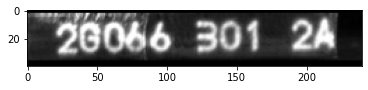

2FZ835013A


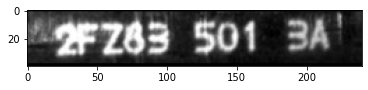

3LS816012A


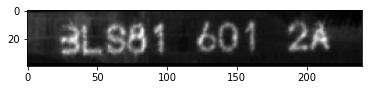

3LW296033F


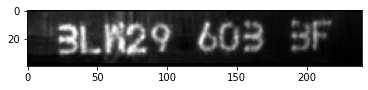

1W730302


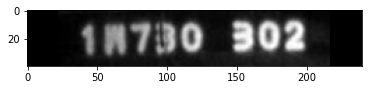

2FM834022X


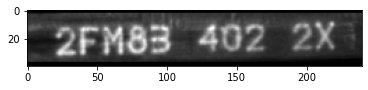

1WD02403


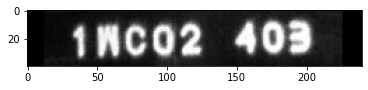

3LL344012A


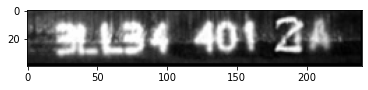

STEP:  96800 TRAIN loss CE: 1.24899, Correct ratio 0.99554, All correct: 0.97194
STEP:  96900 TRAIN loss CE: 1.25838, Correct ratio 0.99595, All correct: 0.97567
STEP:  97000 TRAIN loss CE: 1.29042, Correct ratio 0.99536, All correct: 0.97139
STEP:  97100 TRAIN loss CE: 1.30154, Correct ratio 0.99508, All correct: 0.96741
STEP:  97200 TRAIN loss CE: 1.30690, Correct ratio 0.99506, All correct: 0.96715
STEP:  97300 TRAIN loss CE: 1.30991, Correct ratio 0.99497, All correct: 0.96676
STEP:  97400 TRAIN loss CE: 1.31138, Correct ratio 0.99501, All correct: 0.96610
STEP:  97500 TRAIN loss CE: 1.30849, Correct ratio 0.99506, All correct: 0.96662
STEP:  97600 TRAIN loss CE: 1.31568, Correct ratio 0.99480, All correct: 0.96584
STEP:  97700 TRAIN loss CE: 1.32147, Correct ratio 0.99472, All correct: 0.96589
STEP:  97800 TRAIN loss CE: 1.31336, Correct ratio 0.99489, All correct: 0.96628
STEP:  97900 TRAIN loss CE: 1.31275, Correct ratio 0.99486, All correct: 0.96573
STEP:  98000 TRAIN loss CE: 

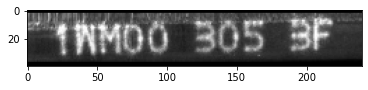

3LT562012F


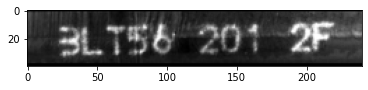

3LY244042T


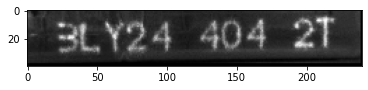

1W3651011H


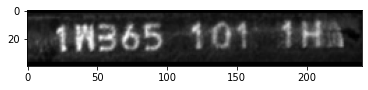

1WB744013A


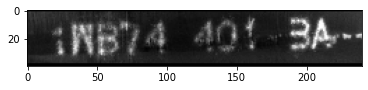

3LU87601


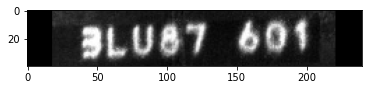

3LY16303


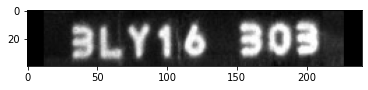

2FU672011T


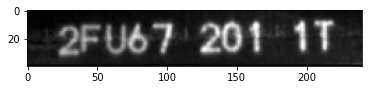

STEP:  99000 TRAIN loss CE: 1.26559, Correct ratio 0.99569, All correct: 0.96843
STEP:  99100 TRAIN loss CE: 1.25940, Correct ratio 0.99566, All correct: 0.97048
STEP:  99200 TRAIN loss CE: 1.30611, Correct ratio 0.99509, All correct: 0.96739
STEP:  99300 TRAIN loss CE: 1.33295, Correct ratio 0.99460, All correct: 0.96460
STEP:  99400 TRAIN loss CE: 1.31488, Correct ratio 0.99491, All correct: 0.96769
STEP:  99500 TRAIN loss CE: 1.30459, Correct ratio 0.99513, All correct: 0.96891
STEP:  99600 TRAIN loss CE: 1.29378, Correct ratio 0.99532, All correct: 0.96888
STEP:  99700 TRAIN loss CE: 1.30341, Correct ratio 0.99525, All correct: 0.96809
STEP:  99800 TRAIN loss CE: 1.30154, Correct ratio 0.99520, All correct: 0.96830
STEP:  99900 TRAIN loss CE: 1.30214, Correct ratio 0.99515, All correct: 0.96822
STEP: 100000 TRAIN loss CE: 1.30497, Correct ratio 0.99510, All correct: 0.96793
STEP: 100100 TRAIN loss CE: 1.31411, Correct ratio 0.99498, All correct: 0.96768
STEP: 100200 TRAIN loss CE: 

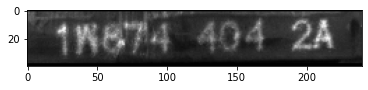

3LW30503


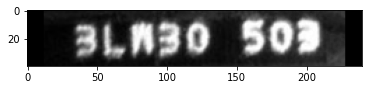

3LP006031A


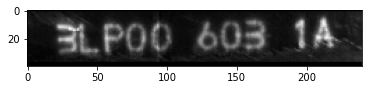

1WB733014A


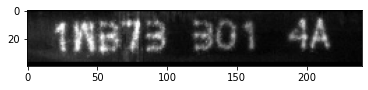

3LY23305


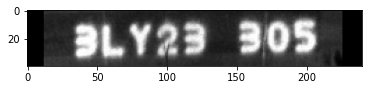

2G084602


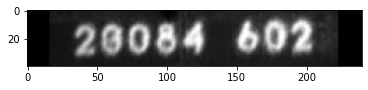

2FR203033X


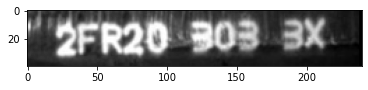

3LU00405


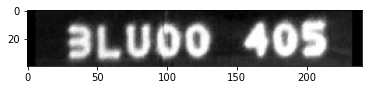

STEP: 101100 TRAIN loss CE: 1.20000, Correct ratio 0.99702, All correct: 0.96939
STEP: 101200 TRAIN loss CE: 1.32477, Correct ratio 0.99483, All correct: 0.96980
STEP: 101300 TRAIN loss CE: 1.34689, Correct ratio 0.99473, All correct: 0.96637
STEP: 101400 TRAIN loss CE: 1.30874, Correct ratio 0.99534, All correct: 0.96705
STEP: 101500 TRAIN loss CE: 1.32224, Correct ratio 0.99501, All correct: 0.96826
STEP: 101600 TRAIN loss CE: 1.31275, Correct ratio 0.99509, All correct: 0.96881
STEP: 101700 TRAIN loss CE: 1.32912, Correct ratio 0.99496, All correct: 0.96880
STEP: 101800 TRAIN loss CE: 1.31702, Correct ratio 0.99503, All correct: 0.96862
STEP: 101900 TRAIN loss CE: 1.32172, Correct ratio 0.99490, All correct: 0.96776
STEP: 102000 TRAIN loss CE: 1.31469, Correct ratio 0.99495, All correct: 0.96773
STEP: 102100 TRAIN loss CE: 1.31053, Correct ratio 0.99502, All correct: 0.96771
STEP: 102200 TRAIN loss CE: 1.31032, Correct ratio 0.99503, All correct: 0.96769
STEP: 102300 TRAIN loss CE: 

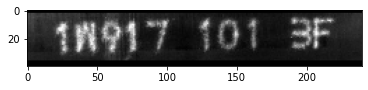

1WA27203


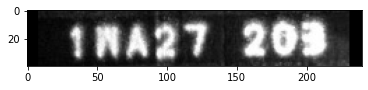

2G1063012A


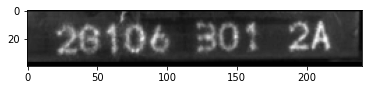

1W9873012F


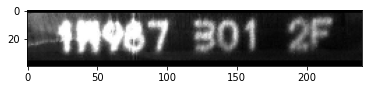

1WD185023F


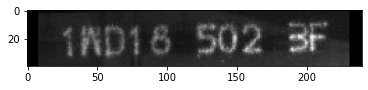

2G047101


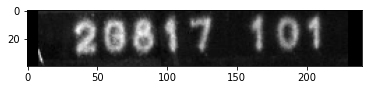

3LU876013A


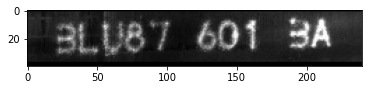

3LR112032H


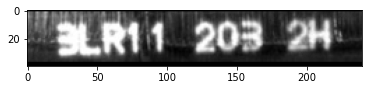

STEP: 103300 TRAIN loss CE: 1.23463, Correct ratio 0.99684, All correct: 0.96843
STEP: 103400 TRAIN loss CE: 1.25319, Correct ratio 0.99607, All correct: 0.96608
STEP: 103500 TRAIN loss CE: 1.29038, Correct ratio 0.99571, All correct: 0.96572
STEP: 103600 TRAIN loss CE: 1.30376, Correct ratio 0.99525, All correct: 0.96585
STEP: 103700 TRAIN loss CE: 1.29129, Correct ratio 0.99545, All correct: 0.96718
STEP: 103800 TRAIN loss CE: 1.28052, Correct ratio 0.99563, All correct: 0.96849
STEP: 103900 TRAIN loss CE: 1.29450, Correct ratio 0.99553, All correct: 0.96853
STEP: 104000 TRAIN loss CE: 1.29265, Correct ratio 0.99550, All correct: 0.96871
STEP: 104100 TRAIN loss CE: 1.28977, Correct ratio 0.99555, All correct: 0.96899
STEP: 104200 TRAIN loss CE: 1.29059, Correct ratio 0.99557, All correct: 0.96922
STEP: 104300 TRAIN loss CE: 1.29361, Correct ratio 0.99549, All correct: 0.96827
STEP: 104400 TRAIN loss CE: 1.29019, Correct ratio 0.99554, All correct: 0.96789
STEP: 104500 TRAIN loss CE: 

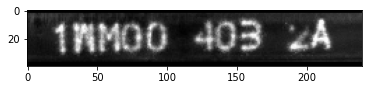

1WD175013F


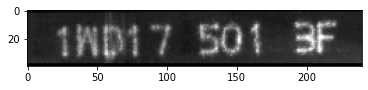

3LU213025T


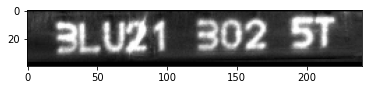

1W7703013F


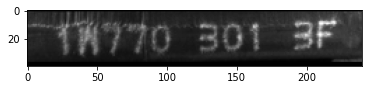

3LQ614031F


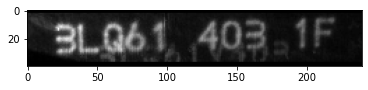

3LX636042F


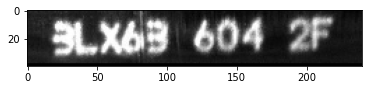

3LQ78403


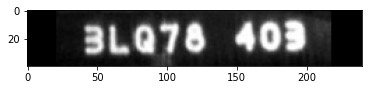

3LU694032X


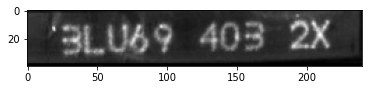

STEP: 105400 TRAIN loss CE: 1.52781, Correct ratio 0.99213, All correct: 0.95663
STEP: 105500 TRAIN loss CE: 1.36355, Correct ratio 0.99532, All correct: 0.97315
STEP: 105600 TRAIN loss CE: 1.33787, Correct ratio 0.99548, All correct: 0.97339
STEP: 105700 TRAIN loss CE: 1.31487, Correct ratio 0.99549, All correct: 0.97135
STEP: 105800 TRAIN loss CE: 1.28912, Correct ratio 0.99580, All correct: 0.97160
STEP: 105900 TRAIN loss CE: 1.28956, Correct ratio 0.99573, All correct: 0.97108
STEP: 106000 TRAIN loss CE: 1.28276, Correct ratio 0.99579, All correct: 0.97053
STEP: 106100 TRAIN loss CE: 1.29078, Correct ratio 0.99576, All correct: 0.97079
STEP: 106200 TRAIN loss CE: 1.28236, Correct ratio 0.99586, All correct: 0.97085
STEP: 106300 TRAIN loss CE: 1.28843, Correct ratio 0.99577, All correct: 0.97076
STEP: 106400 TRAIN loss CE: 1.30733, Correct ratio 0.99533, All correct: 0.96866
STEP: 106500 TRAIN loss CE: 1.31595, Correct ratio 0.99514, All correct: 0.96823
STEP: 106600 TRAIN loss CE: 

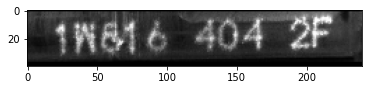

1WB504013A


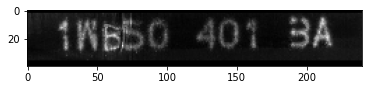

3LT771014Y


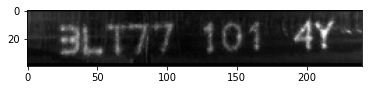

3LK351021H


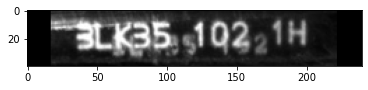

1WC024013X


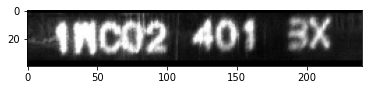

1WH502022F


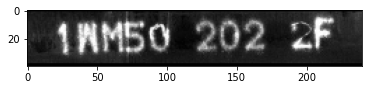

2FV73502


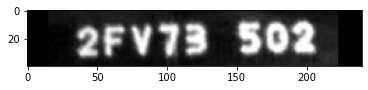

3LW195022F


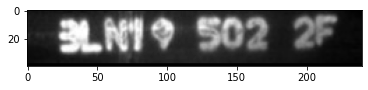

STEP: 107600 TRAIN loss CE: 1.22788, Correct ratio 0.99684, All correct: 0.98359
STEP: 107700 TRAIN loss CE: 1.27026, Correct ratio 0.99602, All correct: 0.97487
STEP: 107800 TRAIN loss CE: 1.25812, Correct ratio 0.99620, All correct: 0.97324
STEP: 107900 TRAIN loss CE: 1.25568, Correct ratio 0.99619, All correct: 0.97431
STEP: 108000 TRAIN loss CE: 1.27192, Correct ratio 0.99587, All correct: 0.97370
STEP: 108100 TRAIN loss CE: 1.26493, Correct ratio 0.99598, All correct: 0.97371
STEP: 108200 TRAIN loss CE: 1.27004, Correct ratio 0.99589, All correct: 0.97282
STEP: 108300 TRAIN loss CE: 1.28566, Correct ratio 0.99546, All correct: 0.97074
STEP: 108400 TRAIN loss CE: 1.29201, Correct ratio 0.99539, All correct: 0.96969
STEP: 108500 TRAIN loss CE: 1.28527, Correct ratio 0.99551, All correct: 0.96997
STEP: 108600 TRAIN loss CE: 1.29015, Correct ratio 0.99548, All correct: 0.97031
STEP: 108700 TRAIN loss CE: 1.28551, Correct ratio 0.99554, All correct: 0.97081
STEP: 108800 TRAIN loss CE: 

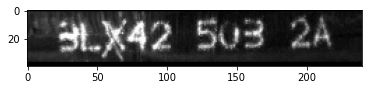

2G003503


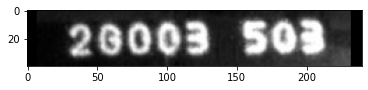

2FW823012A


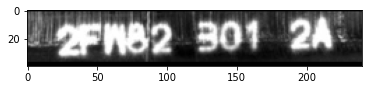

3LX636032F


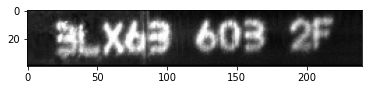

3LQ614023F


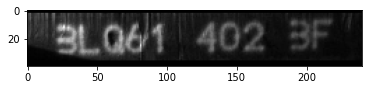

1WB76301


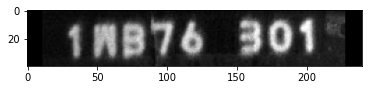

3LX486023A


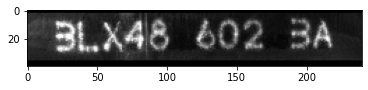

1WC855012F


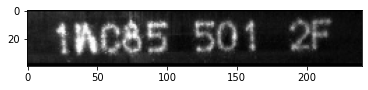

STEP: 109700 TRAIN loss CE: 1.22859, Correct ratio 0.99681, All correct: 0.97194
STEP: 109800 TRAIN loss CE: 1.20421, Correct ratio 0.99727, All correct: 0.97651
STEP: 109900 TRAIN loss CE: 1.23264, Correct ratio 0.99661, All correct: 0.97189
STEP: 110000 TRAIN loss CE: 1.23825, Correct ratio 0.99672, All correct: 0.97421
STEP: 110100 TRAIN loss CE: 1.24360, Correct ratio 0.99647, All correct: 0.97272
STEP: 110200 TRAIN loss CE: 1.25510, Correct ratio 0.99615, All correct: 0.97063
STEP: 110300 TRAIN loss CE: 1.24805, Correct ratio 0.99628, All correct: 0.97111
STEP: 110400 TRAIN loss CE: 1.25439, Correct ratio 0.99627, All correct: 0.97180
STEP: 110500 TRAIN loss CE: 1.26555, Correct ratio 0.99611, All correct: 0.97129
STEP: 110600 TRAIN loss CE: 1.26278, Correct ratio 0.99618, All correct: 0.97181
STEP: 110700 TRAIN loss CE: 1.26453, Correct ratio 0.99618, All correct: 0.97247
STEP: 110800 TRAIN loss CE: 1.25963, Correct ratio 0.99623, All correct: 0.97237
STEP: 110900 TRAIN loss CE: 

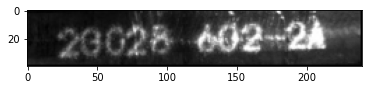

1W4395032A


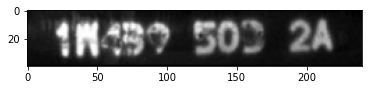

6ST018064T


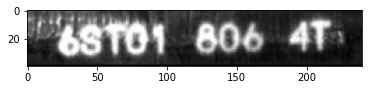

1WB194022F


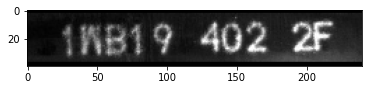

3LY174032A


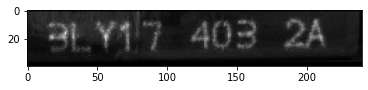

3LV264033A


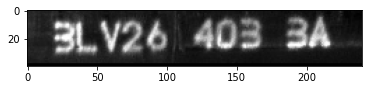

3LU74602


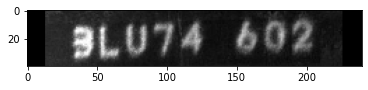

3L983302


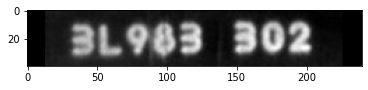

STEP: 111900 TRAIN loss CE: 1.21815, Correct ratio 0.99695, All correct: 0.97601
STEP: 112000 TRAIN loss CE: 1.21171, Correct ratio 0.99696, All correct: 0.97676
STEP: 112100 TRAIN loss CE: 1.27927, Correct ratio 0.99582, All correct: 0.97199
STEP: 112200 TRAIN loss CE: 1.24489, Correct ratio 0.99658, All correct: 0.97650
STEP: 112300 TRAIN loss CE: 1.22868, Correct ratio 0.99689, All correct: 0.97846
STEP: 112400 TRAIN loss CE: 1.24159, Correct ratio 0.99661, All correct: 0.97642
STEP: 112500 TRAIN loss CE: 1.24593, Correct ratio 0.99650, All correct: 0.97550
STEP: 112600 TRAIN loss CE: 1.25110, Correct ratio 0.99647, All correct: 0.97544
STEP: 112700 TRAIN loss CE: 1.25329, Correct ratio 0.99648, All correct: 0.97553
STEP: 112800 TRAIN loss CE: 1.25532, Correct ratio 0.99640, All correct: 0.97523
STEP: 112900 TRAIN loss CE: 1.26533, Correct ratio 0.99615, All correct: 0.97441
STEP: 113000 TRAIN loss CE: 1.26795, Correct ratio 0.99615, All correct: 0.97394
STEP: 113100 TRAIN loss CE: 

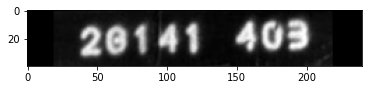

3LK384011F


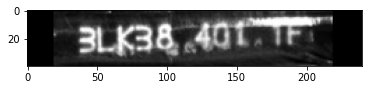

2FS21103


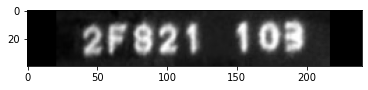

1WL993033A


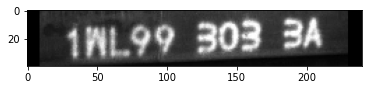

1WB76302


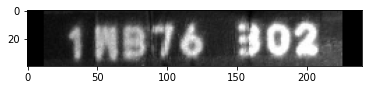

2FU644033F


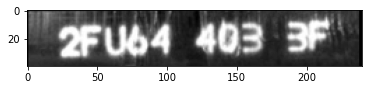

3LU664022A


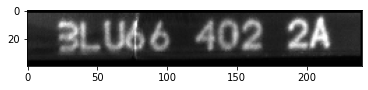

3LT863052H


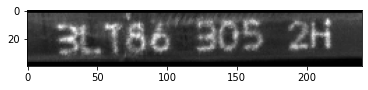

STEP: 114000 TRAIN loss CE: 1.26874, Correct ratio 0.99596, All correct: 0.96173
STEP: 114100 TRAIN loss CE: 1.21392, Correct ratio 0.99664, All correct: 0.96980
STEP: 114200 TRAIN loss CE: 1.26946, Correct ratio 0.99569, All correct: 0.97339
STEP: 114300 TRAIN loss CE: 1.30381, Correct ratio 0.99505, All correct: 0.96884
STEP: 114400 TRAIN loss CE: 1.29786, Correct ratio 0.99531, All correct: 0.96993
STEP: 114500 TRAIN loss CE: 1.28246, Correct ratio 0.99564, All correct: 0.97063
STEP: 114600 TRAIN loss CE: 1.27538, Correct ratio 0.99576, All correct: 0.97092
STEP: 114700 TRAIN loss CE: 1.27555, Correct ratio 0.99574, All correct: 0.97096
STEP: 114800 TRAIN loss CE: 1.26809, Correct ratio 0.99583, All correct: 0.97114
STEP: 114900 TRAIN loss CE: 1.26420, Correct ratio 0.99584, All correct: 0.97155
STEP: 115000 TRAIN loss CE: 1.26344, Correct ratio 0.99590, All correct: 0.97224
STEP: 115100 TRAIN loss CE: 1.25786, Correct ratio 0.99605, All correct: 0.97313
STEP: 115200 TRAIN loss CE: 

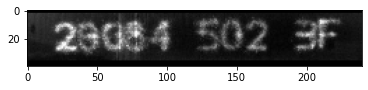

1W8164032F


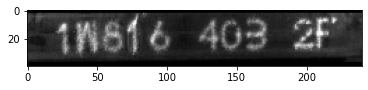

3LW296022F


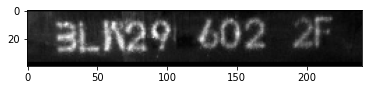

3LY154032A


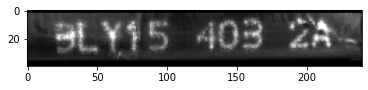

3LK741033H


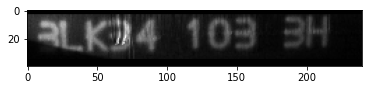

1WE25503


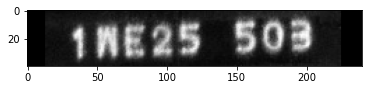

2FU293011Y


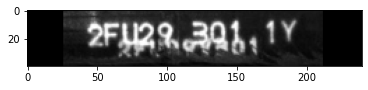

2FY061033A


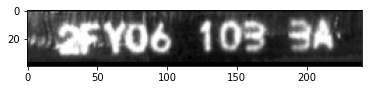

STEP: 116200 TRAIN loss CE: 1.30711, Correct ratio 0.99505, All correct: 0.96717
STEP: 116300 TRAIN loss CE: 1.25629, Correct ratio 0.99592, All correct: 0.97173
STEP: 116400 TRAIN loss CE: 1.26424, Correct ratio 0.99582, All correct: 0.97283
STEP: 116500 TRAIN loss CE: 1.27068, Correct ratio 0.99588, All correct: 0.97431
STEP: 116600 TRAIN loss CE: 1.26624, Correct ratio 0.99597, All correct: 0.97395
STEP: 116700 TRAIN loss CE: 1.27290, Correct ratio 0.99593, All correct: 0.97496
STEP: 116800 TRAIN loss CE: 1.26726, Correct ratio 0.99608, All correct: 0.97479
STEP: 116900 TRAIN loss CE: 1.26228, Correct ratio 0.99611, All correct: 0.97372
STEP: 117000 TRAIN loss CE: 1.27303, Correct ratio 0.99591, All correct: 0.97275
STEP: 117100 TRAIN loss CE: 1.27319, Correct ratio 0.99596, All correct: 0.97272
STEP: 117200 TRAIN loss CE: 1.26918, Correct ratio 0.99600, All correct: 0.97282
STEP: 117300 TRAIN loss CE: 1.26341, Correct ratio 0.99610, All correct: 0.97321
STEP: 117400 TRAIN loss CE: 

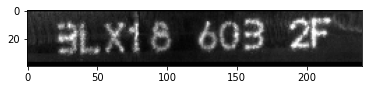

2G7593043T


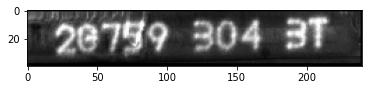

1W703302


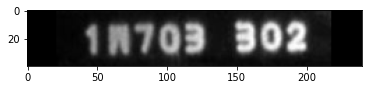

2FP741021H


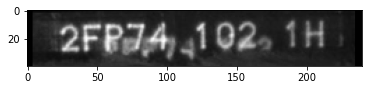

3LX02602


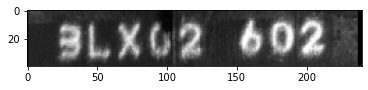

2FZ926012Y


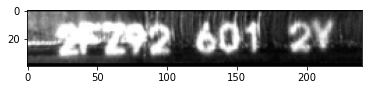

1WM50101


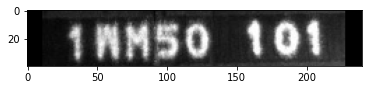

3LQ843013A


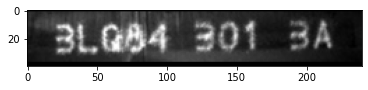

STEP: 118300 TRAIN loss CE: 1.30593, Correct ratio 0.99639, All correct: 0.98469
STEP: 118400 TRAIN loss CE: 1.26829, Correct ratio 0.99622, All correct: 0.97483
STEP: 118500 TRAIN loss CE: 1.22345, Correct ratio 0.99699, All correct: 0.97791
STEP: 118600 TRAIN loss CE: 1.20926, Correct ratio 0.99725, All correct: 0.97815
STEP: 118700 TRAIN loss CE: 1.22749, Correct ratio 0.99671, All correct: 0.97550
STEP: 118800 TRAIN loss CE: 1.24263, Correct ratio 0.99653, All correct: 0.97564
STEP: 118900 TRAIN loss CE: 1.24536, Correct ratio 0.99658, All correct: 0.97612
STEP: 119000 TRAIN loss CE: 1.24091, Correct ratio 0.99655, All correct: 0.97580
STEP: 119100 TRAIN loss CE: 1.25273, Correct ratio 0.99627, All correct: 0.97497
STEP: 119200 TRAIN loss CE: 1.25274, Correct ratio 0.99628, All correct: 0.97550
STEP: 119300 TRAIN loss CE: 1.24976, Correct ratio 0.99637, All correct: 0.97629
STEP: 119400 TRAIN loss CE: 1.25012, Correct ratio 0.99638, All correct: 0.97628
STEP: 119500 TRAIN loss CE: 

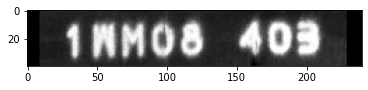

1UY076022F


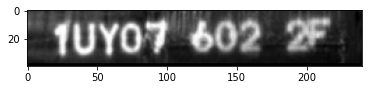

1WB955022X


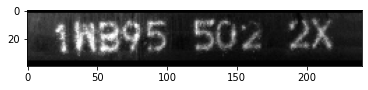

2FU32401


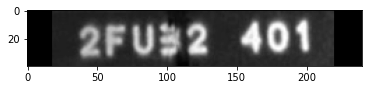

3LU776023Y


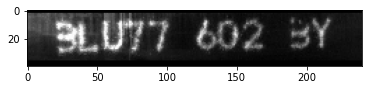

1W608603


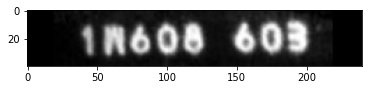

3LX00601


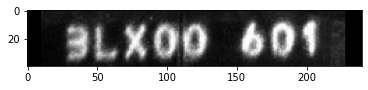

1WM00402


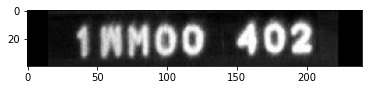

STEP: 120500 TRAIN loss CE: 1.17178, Correct ratio 0.99811, All correct: 0.98232
STEP: 120600 TRAIN loss CE: 1.19834, Correct ratio 0.99764, All correct: 0.98053
STEP: 120700 TRAIN loss CE: 1.20801, Correct ratio 0.99742, All correct: 0.97952
STEP: 120800 TRAIN loss CE: 1.23226, Correct ratio 0.99697, All correct: 0.97870
STEP: 120900 TRAIN loss CE: 1.25686, Correct ratio 0.99647, All correct: 0.97670
STEP: 121000 TRAIN loss CE: 1.25024, Correct ratio 0.99668, All correct: 0.97788
STEP: 121100 TRAIN loss CE: 1.25556, Correct ratio 0.99647, All correct: 0.97604
STEP: 121200 TRAIN loss CE: 1.26495, Correct ratio 0.99634, All correct: 0.97544
STEP: 121300 TRAIN loss CE: 1.25959, Correct ratio 0.99643, All correct: 0.97553
STEP: 121400 TRAIN loss CE: 1.25799, Correct ratio 0.99647, All correct: 0.97523
STEP: 121500 TRAIN loss CE: 1.26526, Correct ratio 0.99631, All correct: 0.97498
STEP: 121600 TRAIN loss CE: 1.26290, Correct ratio 0.99632, All correct: 0.97508
STEP: 121700 TRAIN loss CE: 

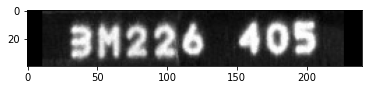

3M179402


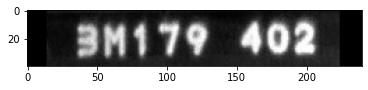

2FT003033A


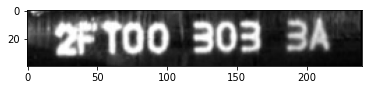

3LT422043A


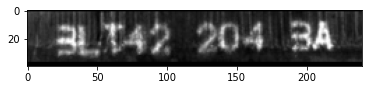

1WB284013F


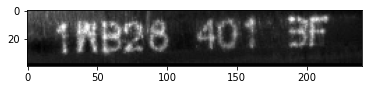

2FY55602


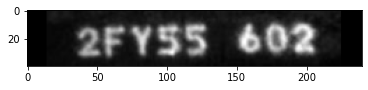

1W7313032T


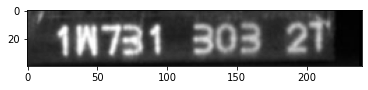

3LW31503


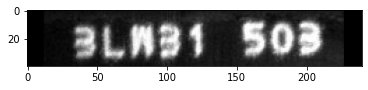

STEP: 122600 TRAIN loss CE: 1.15097, Correct ratio 0.99787, All correct: 0.98980
STEP: 122700 TRAIN loss CE: 1.19018, Correct ratio 0.99797, All correct: 0.98406
STEP: 122800 TRAIN loss CE: 1.22479, Correct ratio 0.99699, All correct: 0.97691
STEP: 122900 TRAIN loss CE: 1.24718, Correct ratio 0.99657, All correct: 0.97672
STEP: 123000 TRAIN loss CE: 1.25590, Correct ratio 0.99659, All correct: 0.97661
STEP: 123100 TRAIN loss CE: 1.25082, Correct ratio 0.99660, All correct: 0.97587
STEP: 123200 TRAIN loss CE: 1.23852, Correct ratio 0.99681, All correct: 0.97650
STEP: 123300 TRAIN loss CE: 1.23734, Correct ratio 0.99677, All correct: 0.97730
STEP: 123400 TRAIN loss CE: 1.23655, Correct ratio 0.99681, All correct: 0.97718
STEP: 123500 TRAIN loss CE: 1.23352, Correct ratio 0.99682, All correct: 0.97708
STEP: 123600 TRAIN loss CE: 1.23891, Correct ratio 0.99674, All correct: 0.97700
STEP: 123700 TRAIN loss CE: 1.24553, Correct ratio 0.99668, All correct: 0.97705
STEP: 123800 TRAIN loss CE: 

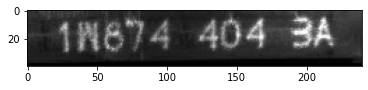

3LQ881022F


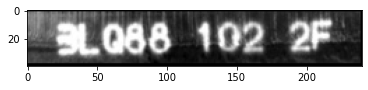

2G048304


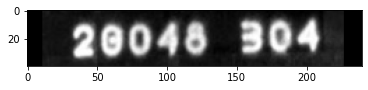

1W8061033A


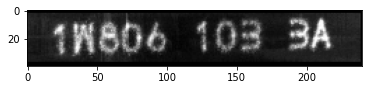

6T0121052F


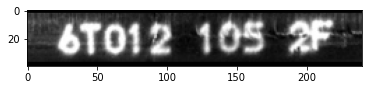

3LP043051A


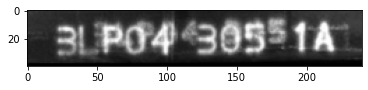

1W4861012F


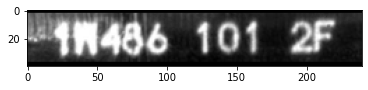

3M2104012A


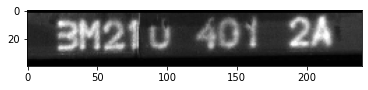

STEP: 124800 TRAIN loss CE: 1.20795, Correct ratio 0.99716, All correct: 0.97727
STEP: 124900 TRAIN loss CE: 1.23796, Correct ratio 0.99681, All correct: 0.97676
STEP: 125000 TRAIN loss CE: 1.22035, Correct ratio 0.99700, All correct: 0.97659
STEP: 125100 TRAIN loss CE: 1.22754, Correct ratio 0.99661, All correct: 0.97650


KeyboardInterrupt: 

In [13]:
%run train.py

STEP:    100 TRAIN loss CE: 0.34252, Correct ratio 0.99762, All correct: 0.97811
STEP:    200 TRAIN loss CE: 0.34291, Correct ratio 0.99756, All correct: 0.97822
STEP:    300 TRAIN loss CE: 0.35575, Correct ratio 0.99749, All correct: 0.97993
STEP:    400 TRAIN loss CE: 0.35100, Correct ratio 0.99760, All correct: 0.98079
STEP:    500 TRAIN loss CE: 0.34946, Correct ratio 0.99755, All correct: 0.97929
STEP:    600 TRAIN loss CE: 0.34250, Correct ratio 0.99764, All correct: 0.98024
STEP:    700 TRAIN loss CE: 0.35047, Correct ratio 0.99742, All correct: 0.97926
STEP:    800 TRAIN loss CE: 0.35932, Correct ratio 0.99720, All correct: 0.97851
STEP:    900 TRAIN loss CE: 0.35600, Correct ratio 0.99727, All correct: 0.97905
STEP:   1000 TRAIN loss CE: 0.35041, Correct ratio 0.99732, All correct: 0.97915
STEP:   1100 TRAIN loss CE: 0.35846, Correct ratio 0.99723, All correct: 0.97892
STEP:   1200 TRAIN loss CE: 0.37430, Correct ratio 0.99694, All correct: 0.97776
STEP:   1300 TRAIN loss CE: 

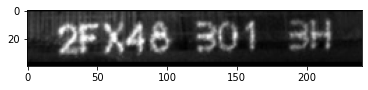

2FS901034


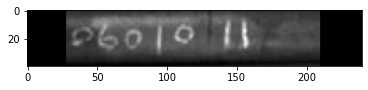

1WB72403


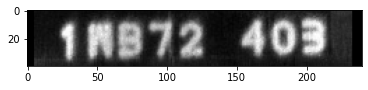

3LN092011A


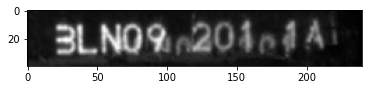

5L6019064F


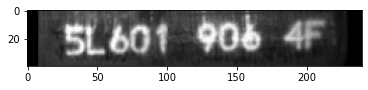

2G7563032X


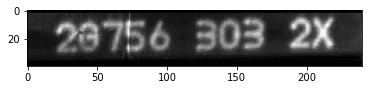

3LV283032F


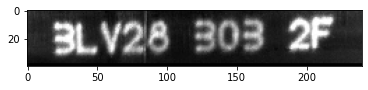

2FW283052A


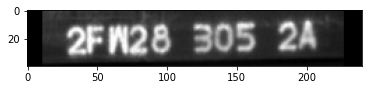

STEP:   2900 TRAIN loss CE: 0.27479, Correct ratio 0.99913, All correct: 0.98958
STEP:   3000 TRAIN loss CE: 0.31930, Correct ratio 0.99769, All correct: 0.97854
STEP:   3100 TRAIN loss CE: 0.31856, Correct ratio 0.99767, All correct: 0.98276
STEP:   3200 TRAIN loss CE: 0.33691, Correct ratio 0.99716, All correct: 0.97942
STEP:   3300 TRAIN loss CE: 0.33909, Correct ratio 0.99727, All correct: 0.98032
STEP:   3400 TRAIN loss CE: 0.34557, Correct ratio 0.99723, All correct: 0.98026
STEP:   3500 TRAIN loss CE: 0.33472, Correct ratio 0.99750, All correct: 0.98180
STEP:   3600 TRAIN loss CE: 0.33029, Correct ratio 0.99755, All correct: 0.98156
STEP:   3700 TRAIN loss CE: 0.33859, Correct ratio 0.99745, All correct: 0.98097
STEP:   3800 TRAIN loss CE: 0.34423, Correct ratio 0.99730, All correct: 0.97979
STEP:   3900 TRAIN loss CE: 0.34105, Correct ratio 0.99729, All correct: 0.97981
STEP:   4000 TRAIN loss CE: 0.34897, Correct ratio 0.99718, All correct: 0.97953
STEP:   4100 TRAIN loss CE: 

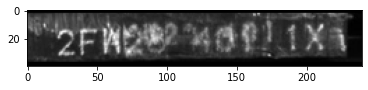

1W7271022A


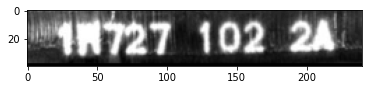

2FR204021L


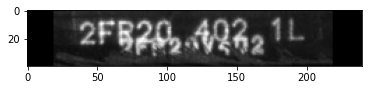

3LY08401


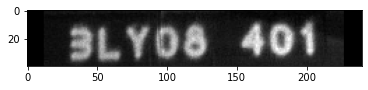

3LY143022A


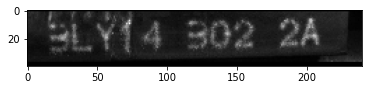

2FU70401


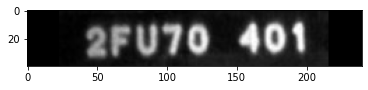

3LR741012A


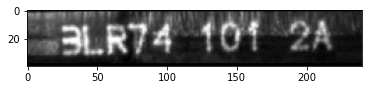

3LV343012K


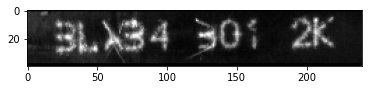

STEP:   5800 TRAIN loss CE: 0.41809, Correct ratio 0.99509, All correct: 0.96154
STEP:   5900 TRAIN loss CE: 0.35656, Correct ratio 0.99663, All correct: 0.97374
STEP:   6000 TRAIN loss CE: 0.34763, Correct ratio 0.99670, All correct: 0.97547
STEP:   6100 TRAIN loss CE: 0.35219, Correct ratio 0.99635, All correct: 0.97260
STEP:   6200 TRAIN loss CE: 0.34144, Correct ratio 0.99663, All correct: 0.97384
STEP:   6300 TRAIN loss CE: 0.33159, Correct ratio 0.99685, All correct: 0.97404
STEP:   6400 TRAIN loss CE: 0.34509, Correct ratio 0.99658, All correct: 0.97368
STEP:   6500 TRAIN loss CE: 0.34701, Correct ratio 0.99670, All correct: 0.97538
STEP:   6600 TRAIN loss CE: 0.34516, Correct ratio 0.99677, All correct: 0.97611
STEP:   6700 TRAIN loss CE: 0.35034, Correct ratio 0.99665, All correct: 0.97582
STEP:   6800 TRAIN loss CE: 0.38477, Correct ratio 0.99620, All correct: 0.97465
STEP:   6900 TRAIN loss CE: 0.37969, Correct ratio 0.99634, All correct: 0.97511
STEP:   7000 TRAIN loss CE: 

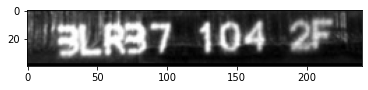

2FX901022H


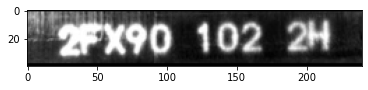

3LV28401


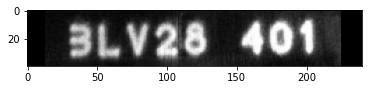

1WD295032A


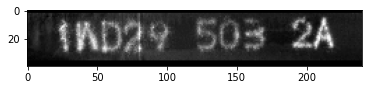

3LT196014F


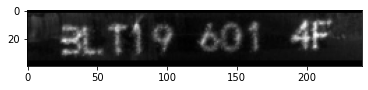

3LT922031X


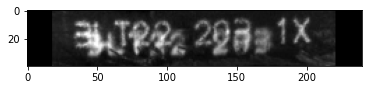

2FT970013


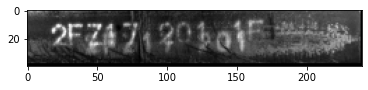

1WC044013A


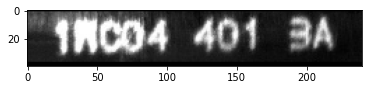

STEP:   8700 TRAIN loss CE: 0.26730, Correct ratio 0.99802, All correct: 0.97789
STEP:   8800 TRAIN loss CE: 0.36800, Correct ratio 0.99600, All correct: 0.96886
STEP:   8900 TRAIN loss CE: 0.35158, Correct ratio 0.99655, All correct: 0.97371
STEP:   9000 TRAIN loss CE: 0.35184, Correct ratio 0.99627, All correct: 0.97152
STEP:   9100 TRAIN loss CE: 0.34351, Correct ratio 0.99640, All correct: 0.97155
STEP:   9200 TRAIN loss CE: 0.33132, Correct ratio 0.99668, All correct: 0.97324
STEP:   9300 TRAIN loss CE: 0.32630, Correct ratio 0.99678, All correct: 0.97421
STEP:   9400 TRAIN loss CE: 0.31907, Correct ratio 0.99694, All correct: 0.97598


KeyboardInterrupt: 

In [13]:
%run train.py

In [17]:
epoch = tf.Variable(e)
step = tf.Variable(step)
checkpoint = tf.train.Checkpoint(model=model, optimizer=optimizer, epoch=epoch, step=step)
checkpoint.save(r'D:\DL_competition_Dataset\ChinaSteel\OCR_model_weights\model_6\trial_1\checkpoint\ckpt')

'D:\\DL_competition_Dataset\\ChinaSteel\\OCR_model_weights\\model_6\\trial_1\\checkpoint\\ckpt-1'

In [15]:
# model2 = Model()
# optimizer2 = tf.keras.optimizers.Adam()

In [16]:
# checkpoint2 = tf.train.Checkpoint(model=model2, optimizer=optimizer2)
# checkpoint2.restore(r'D:\DL_competition_Dataset\ChinaSteel\OCR_model_weights\model_2\trial_2\checkpoint_test\ckpt-1')